In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import sys
import os
from os.path import join
import json
import pickle as pkl
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from tqdm.auto import trange, tqdm
import numpy as np
import matplotlib.pyplot as plt
from easydict import EasyDict as edict
sys.path.append("/n/home12/binxuwang/Github/DiffusionLearningCurve")
sys.path.append("/Users/binxuwang/Github/DiffusionLearningCurve/")
from core.diffusion_nn_lib import UNetBlockStyleMLP_backbone
from core.toy_shape_dataset_lib import generate_random_star_shape_torch
from core.diffusion_basics_lib import *
from core.diffusion_edm_lib import *
from core.network_edm_lib import SongUNet, DhariwalUNet
from core.DiT_model_lib import *
from core.diffusion_nn_lib import UNetBlockStyleMLP_backbone
from circuit_toolkit.plot_utils import saveallforms, to_imgrid, show_imgrid
from pprint import pprint

saveroot = f"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve"

In [4]:
def find_all_ckpt_steps(ckptdir, verbose=True):
    ckpt_files = [f for f in os.listdir(ckptdir) if f.startswith("model_epoch_") and f.endswith(".pth")]
    ckpt_steps = [int(f.split("_")[-1].split(".")[0]) for f in ckpt_files]
    if verbose:
        print(f"Found {len(ckpt_steps)} checkpoints in the directory, largest step is {max(ckpt_steps)}")
    return sorted(ckpt_steps)

In [5]:
device = "cuda"
imgshape = (3, 32, 32)

# loading config 
expname = "FFHQ32_DiT_P2_384D_6H_6L_EDM_saveckpt_fewsample_longtrain"
savedir = join(saveroot, expname)
ckptdir = join(savedir, "ckpts")
sample_dir = join(savedir, "samples")
config = edict(json.load(open(f"{savedir}/config.json")))
args = edict(json.load(open(f"{savedir}/args.json")))
pprint(config)
DiT_model = DiT(**config)
DiT_precd = EDMDiTPrecondWrapper(DiT_model, sigma_data=0.5, sigma_min=0.002, sigma_max=80, rho=7.0)

figdir = join(savedir, "gradient_maps")
jacobdir = join(savedir, "jacobian_store")
denoiserdir = join(savedir, "denoised_imgs")
os.makedirs(figdir, exist_ok=True)
os.makedirs(jacobdir, exist_ok=True)
os.makedirs(denoiserdir, exist_ok=True)
# Find the largest checkpoint step in the directory
# ckpt_step = find_largest_ckpt_step(ckptdir)
# device = "cuda"
# ckpt_path = join(ckptdir, f"model_epoch_{ckpt_step:06d}.pth")
# DiT_precd.load_state_dict(torch.load(ckpt_path))
# DiT_precd = DiT_precd.to(device).eval()
# DiT_precd.requires_grad_(False);

{'class_dropout_prob': 0.1,
 'depth': 6,
 'hidden_size': 384,
 'in_channels': 3,
 'input_size': 32,
 'learn_sigma': False,
 'mlp_ratio': 4,
 'num_classes': 0,
 'num_heads': 6,
 'patch_size': 2}


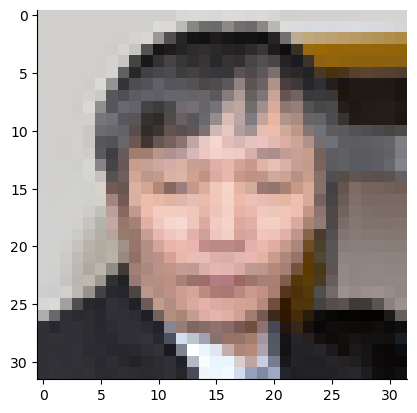

In [6]:
data_Xtsr = torch.load("/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/wordnet_render_dataset/ffhq-32x32.pt")
# ref_x_raw = data_Xtsr[77] # 77 is a nice example
ref_x_raw = data_Xtsr[188] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
# ref_x = ref_x.flatten()
plt.imshow(ref_x_raw.permute(1, 2, 0).cpu().numpy())

Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/9 [00:00<?, ?it/s]

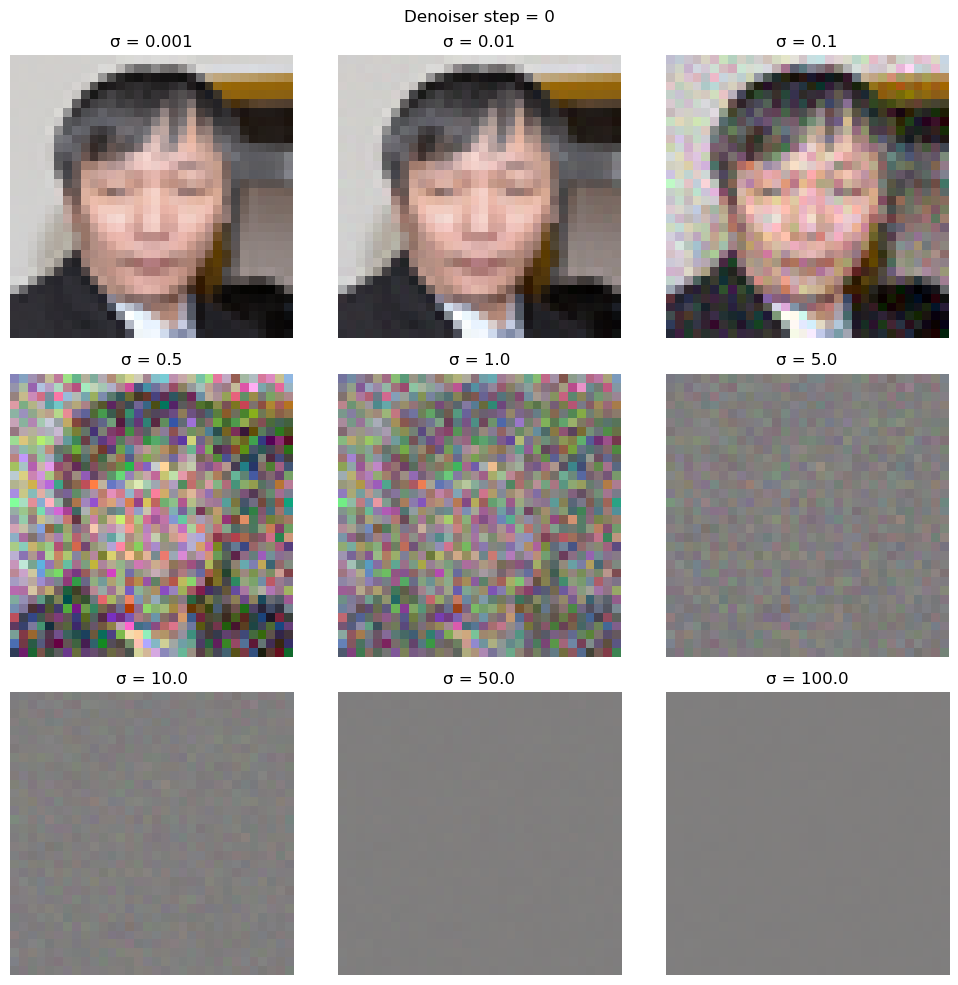

  0%|          | 0/9 [00:00<?, ?it/s]

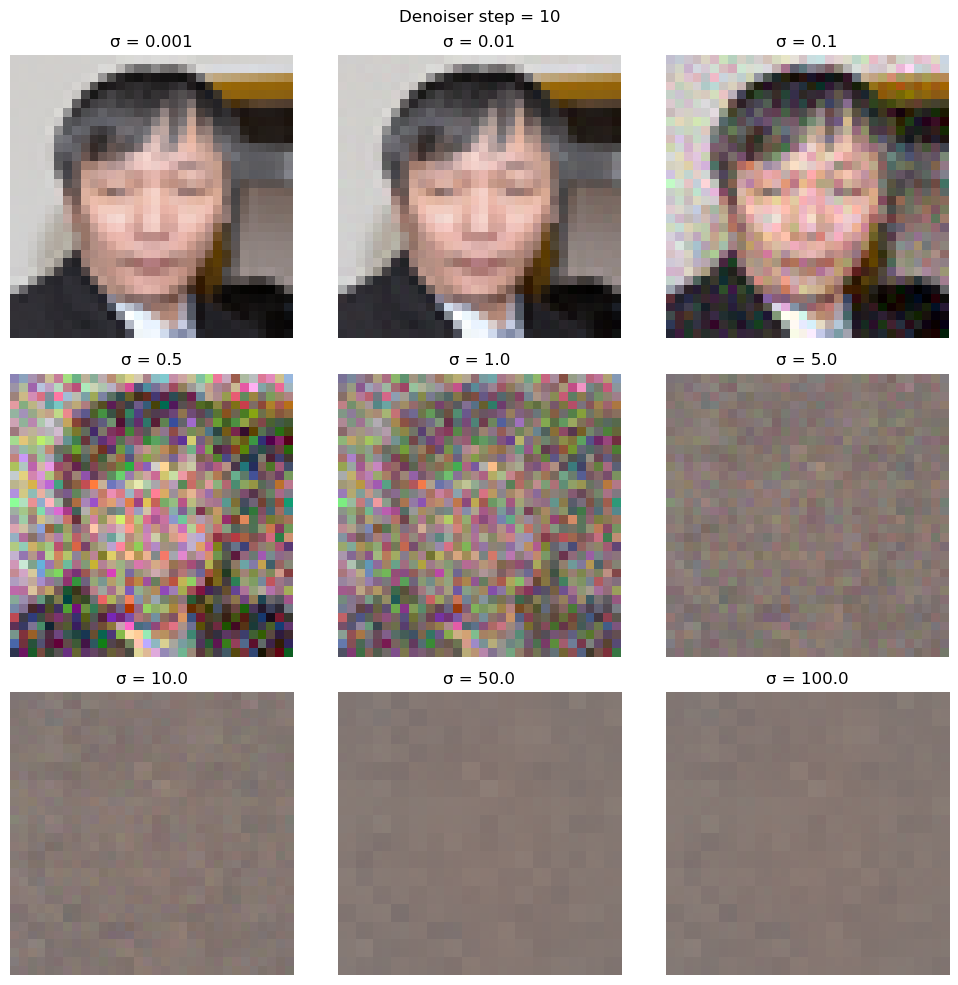

  0%|          | 0/9 [00:00<?, ?it/s]

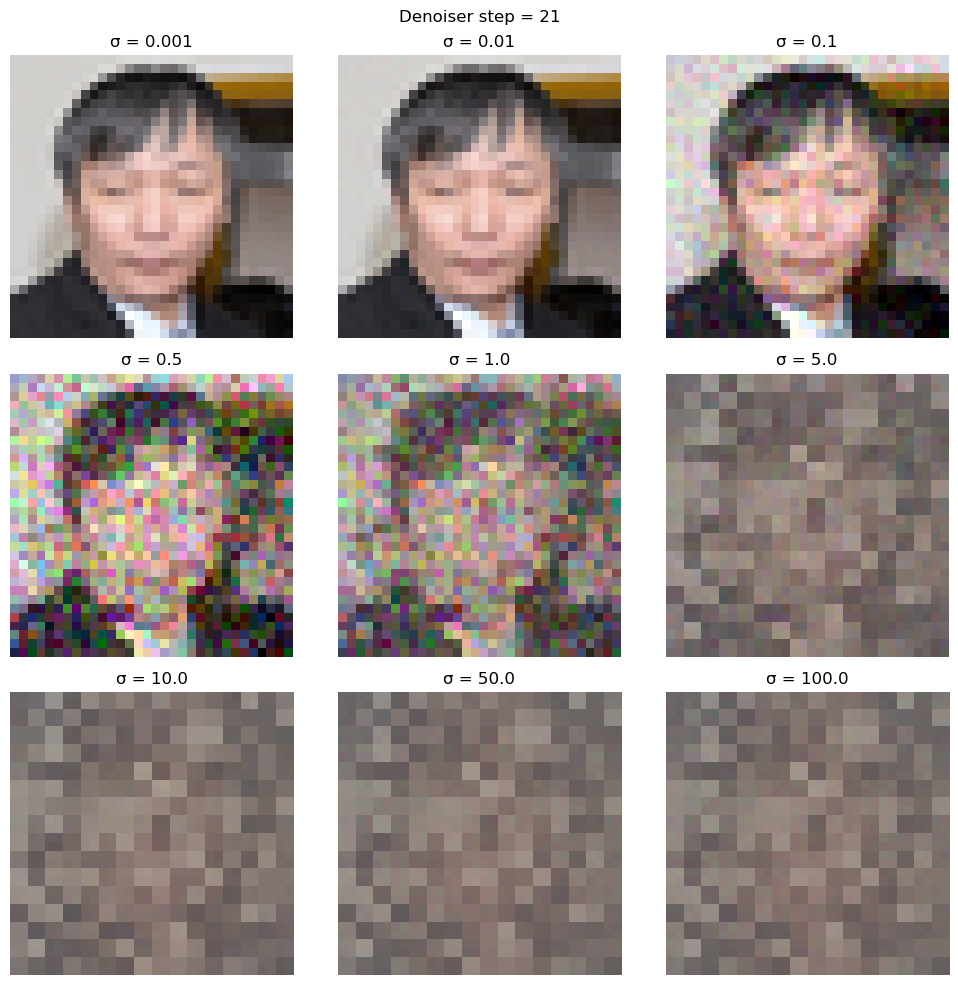

  0%|          | 0/9 [00:00<?, ?it/s]

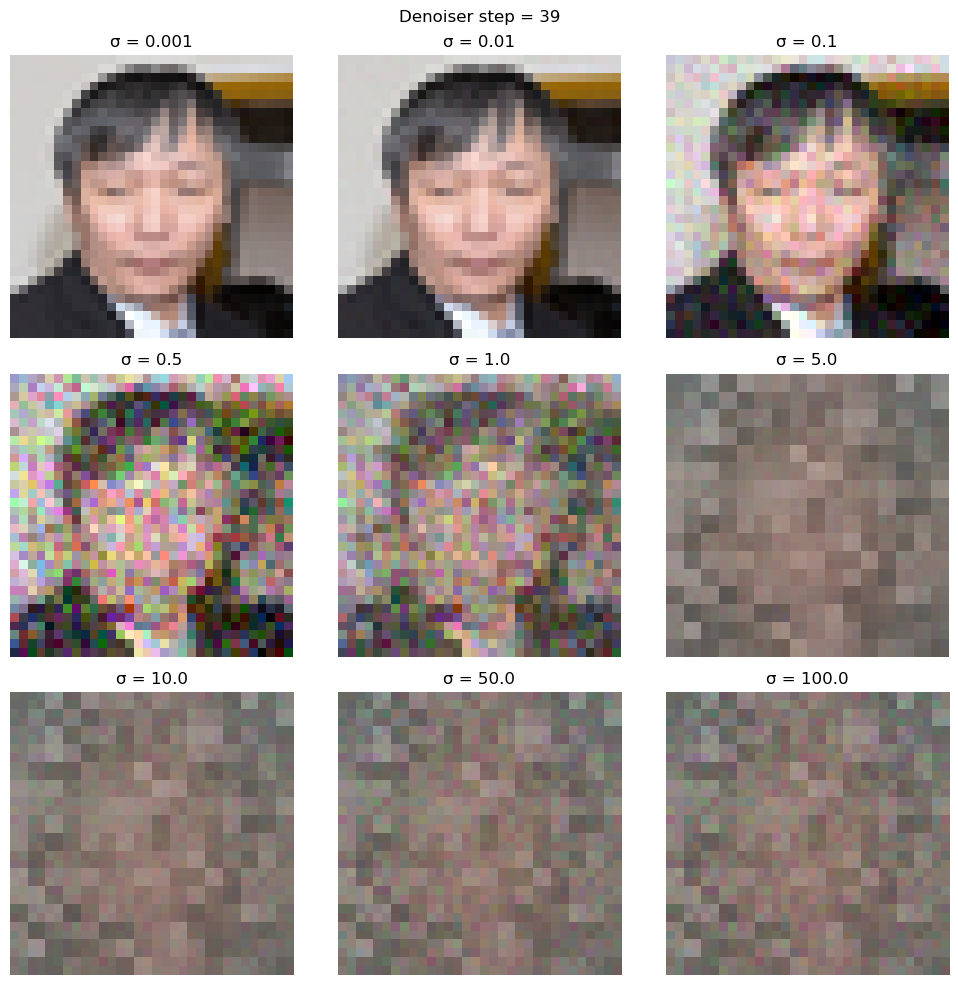

  0%|          | 0/9 [00:00<?, ?it/s]

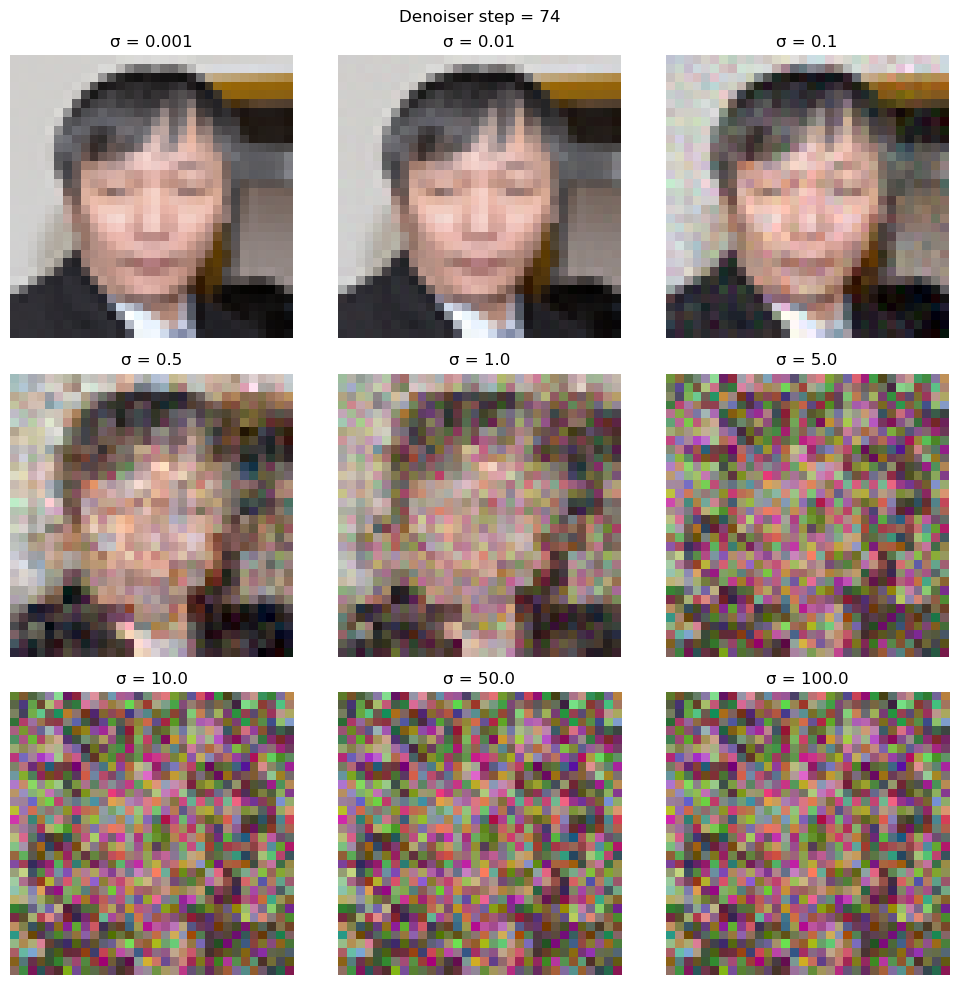

  0%|          | 0/9 [00:00<?, ?it/s]

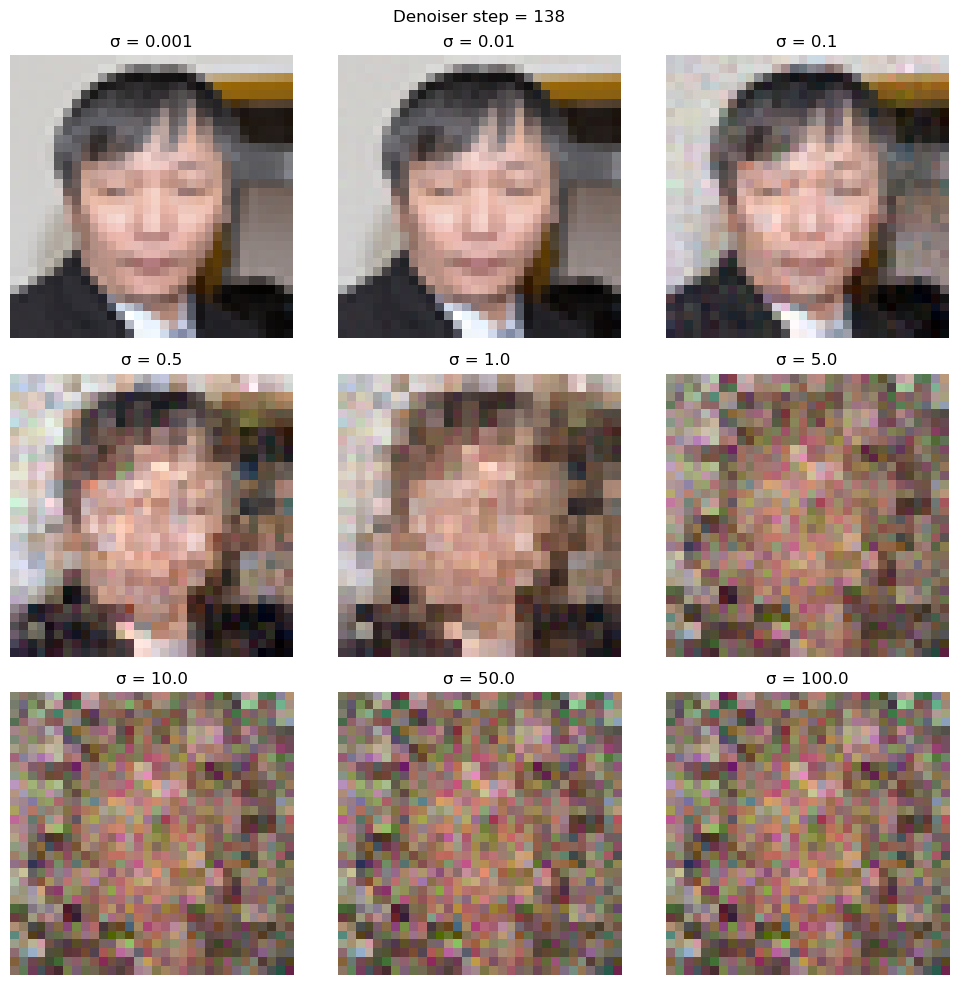

  0%|          | 0/9 [00:00<?, ?it/s]

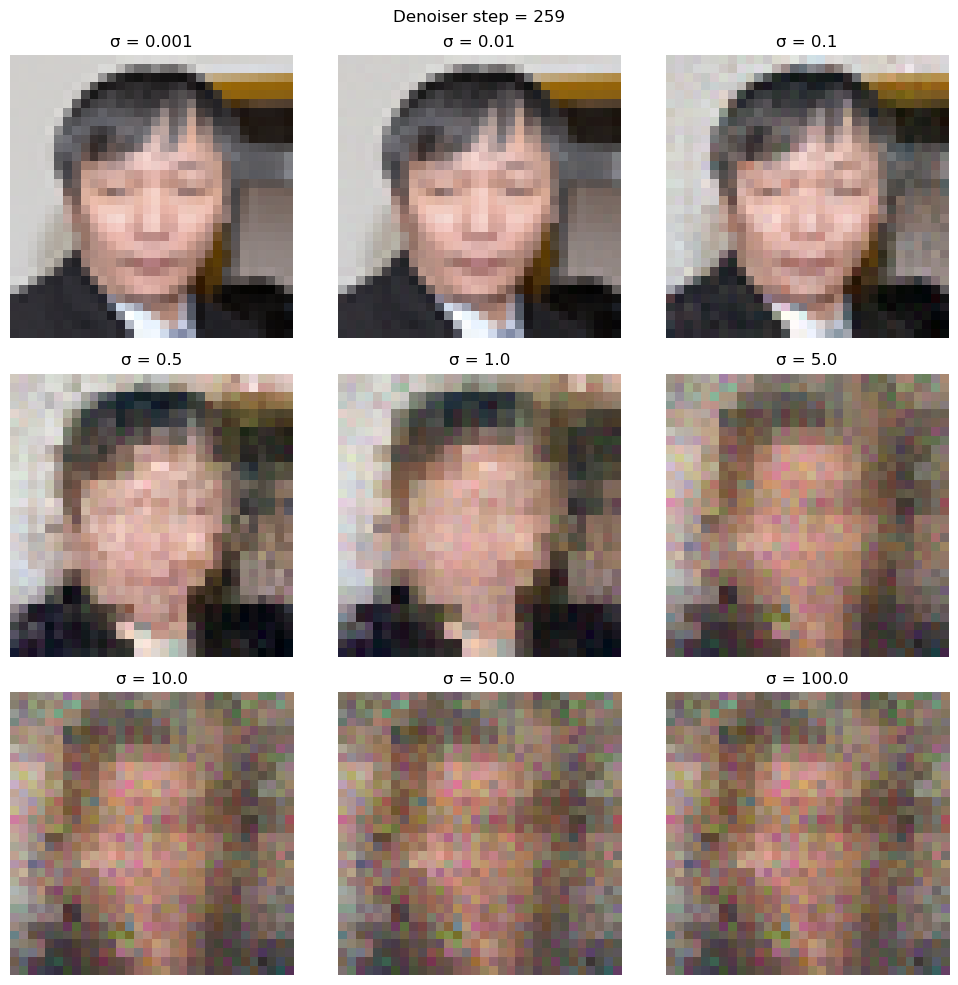

  0%|          | 0/9 [00:00<?, ?it/s]

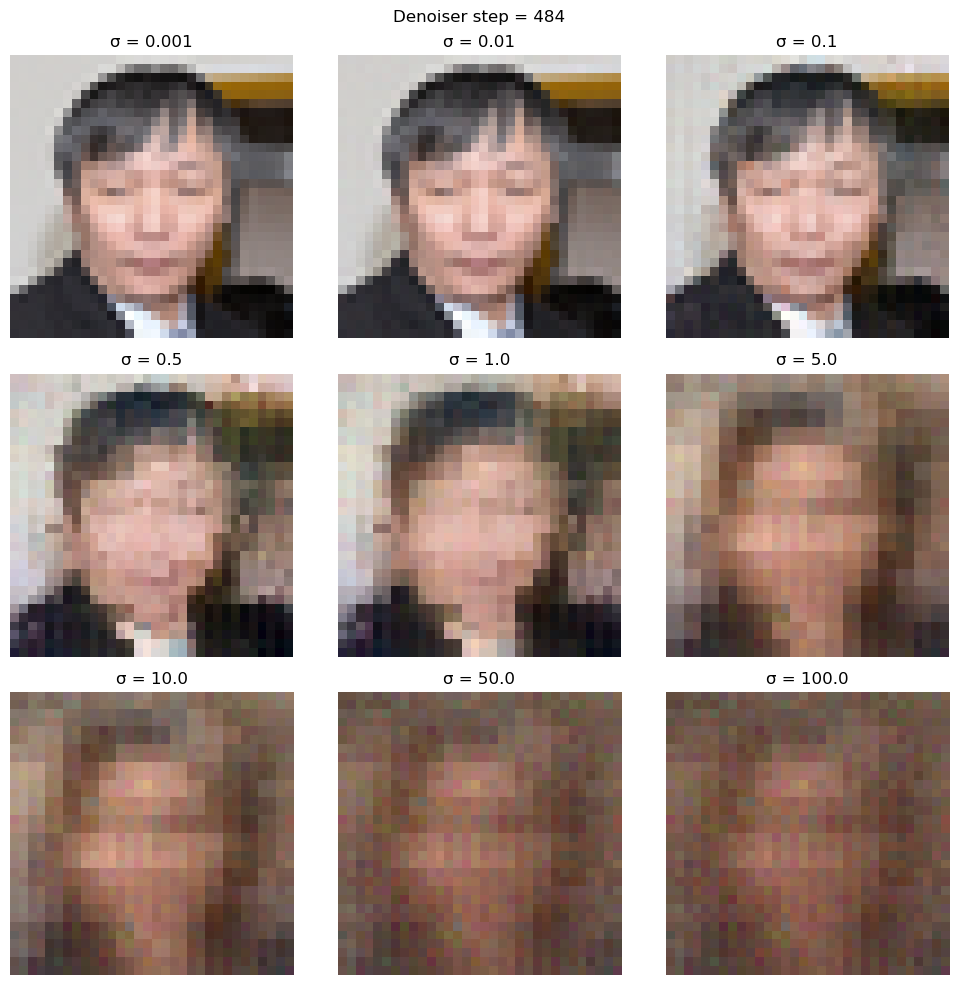

  0%|          | 0/9 [00:00<?, ?it/s]

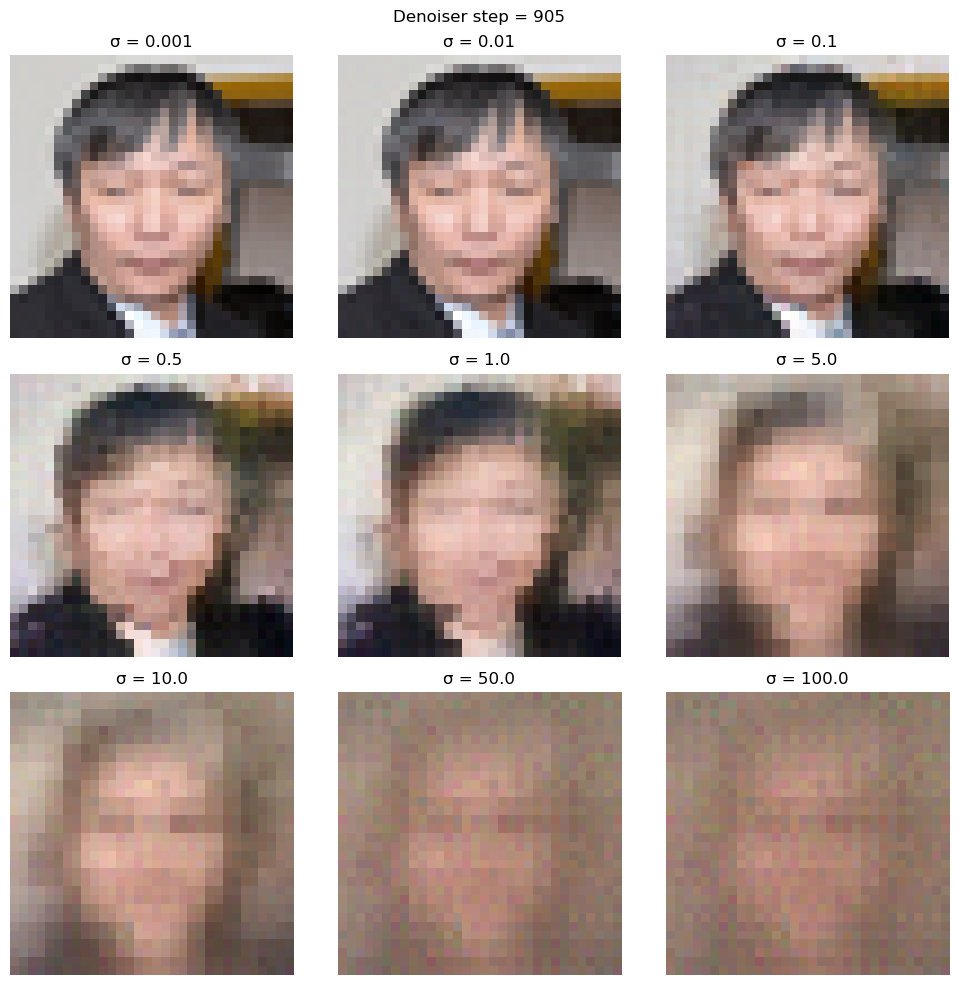

  0%|          | 0/9 [00:00<?, ?it/s]

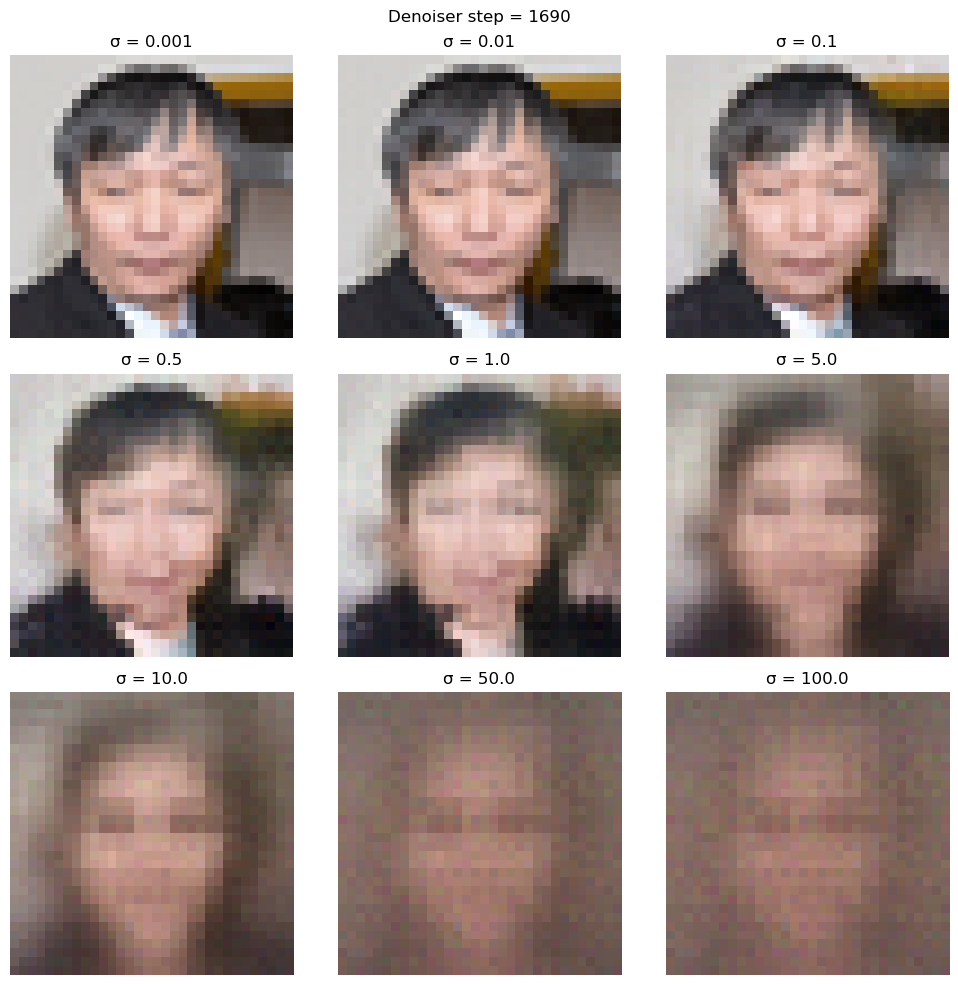

  0%|          | 0/9 [00:00<?, ?it/s]

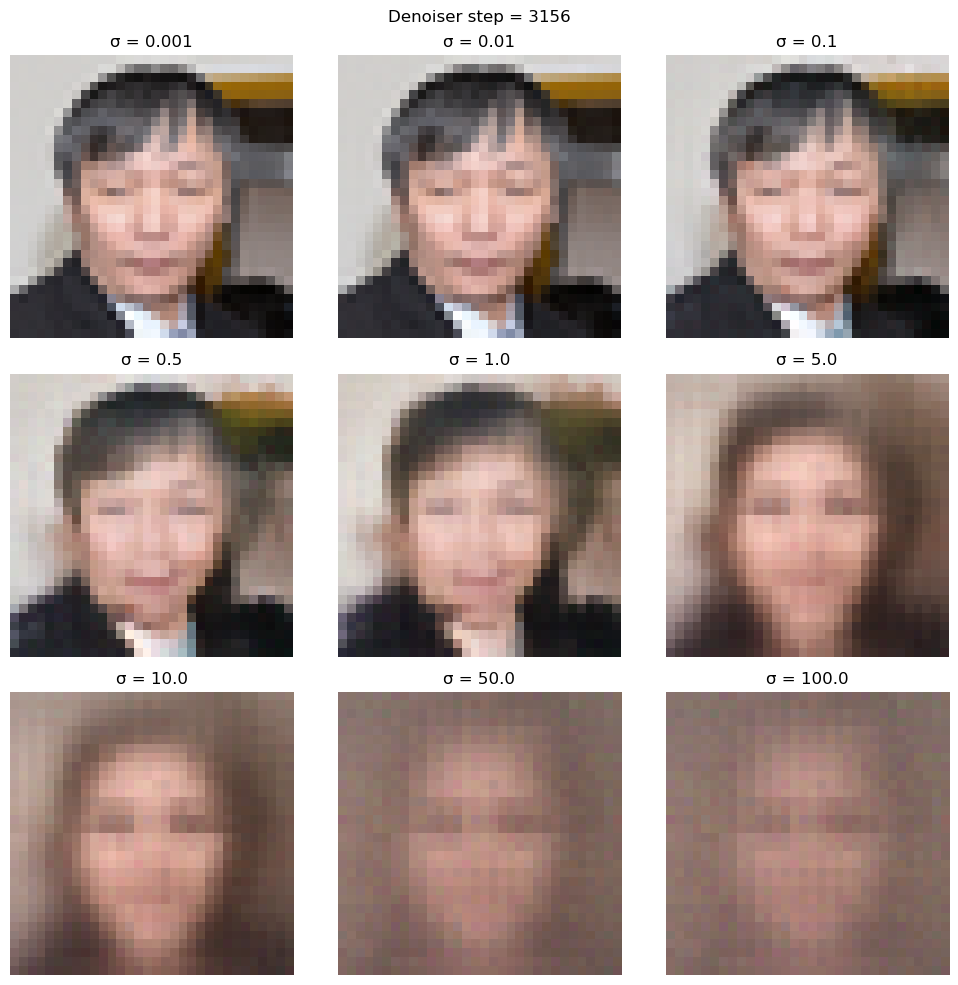

  0%|          | 0/9 [00:00<?, ?it/s]

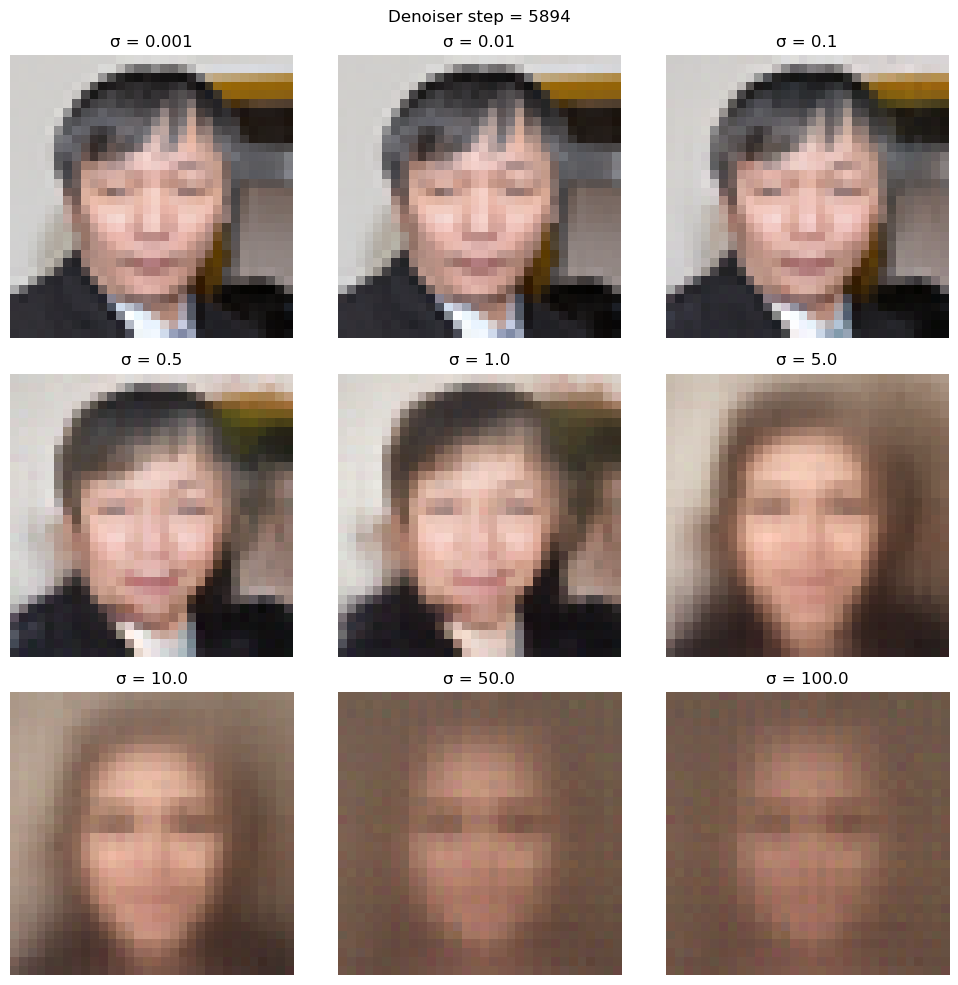

  0%|          | 0/9 [00:00<?, ?it/s]

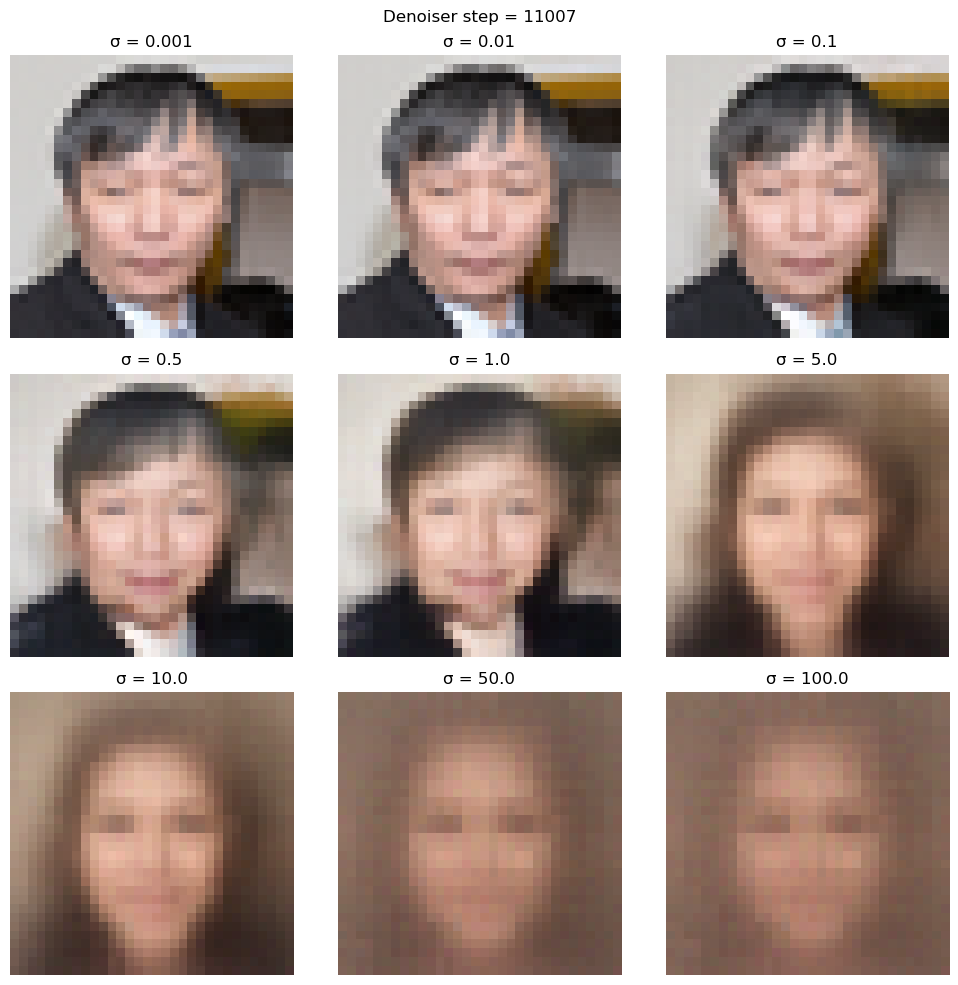

  0%|          | 0/9 [00:00<?, ?it/s]

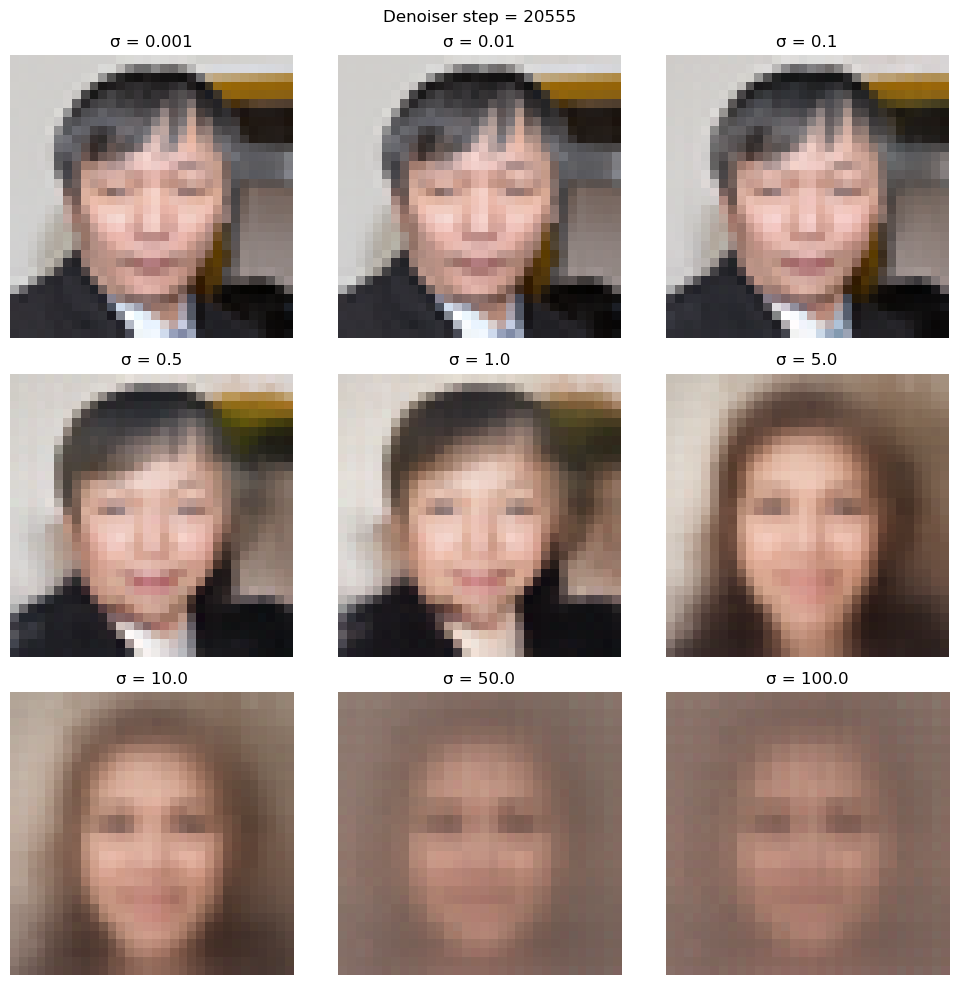

  0%|          | 0/9 [00:00<?, ?it/s]

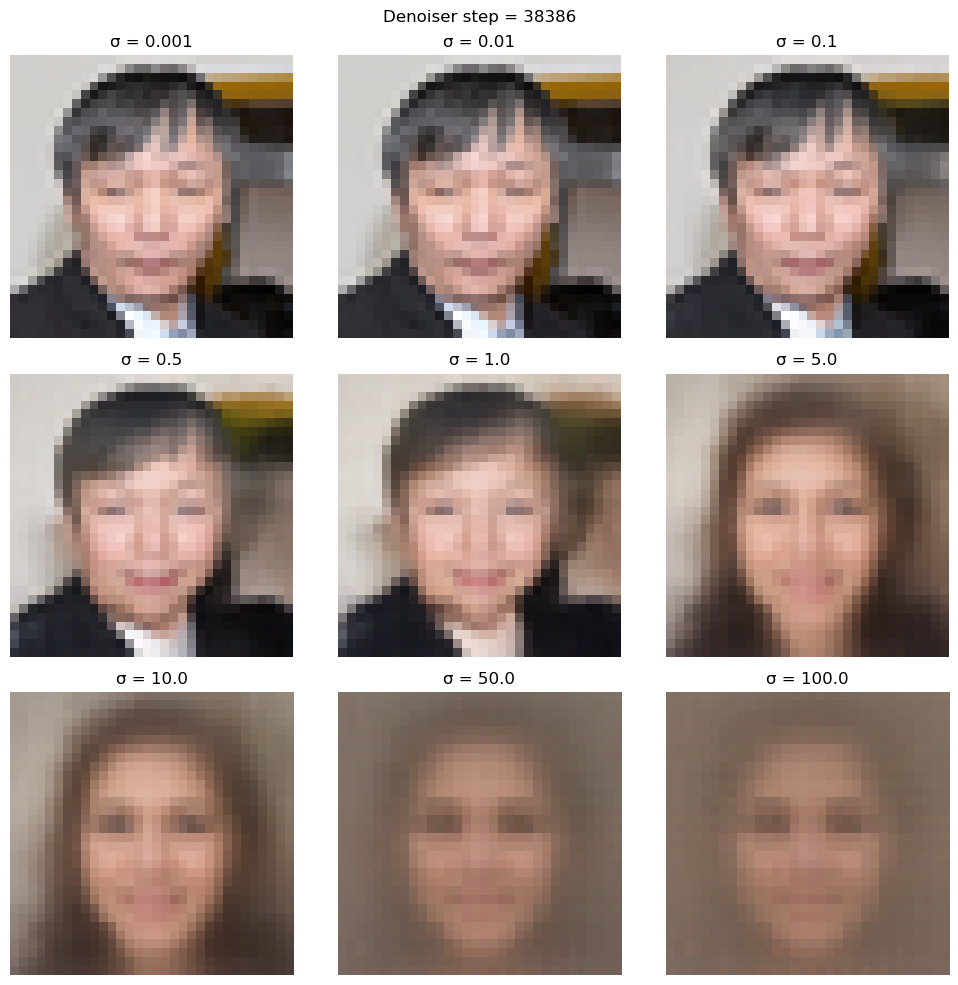

  0%|          | 0/9 [00:00<?, ?it/s]

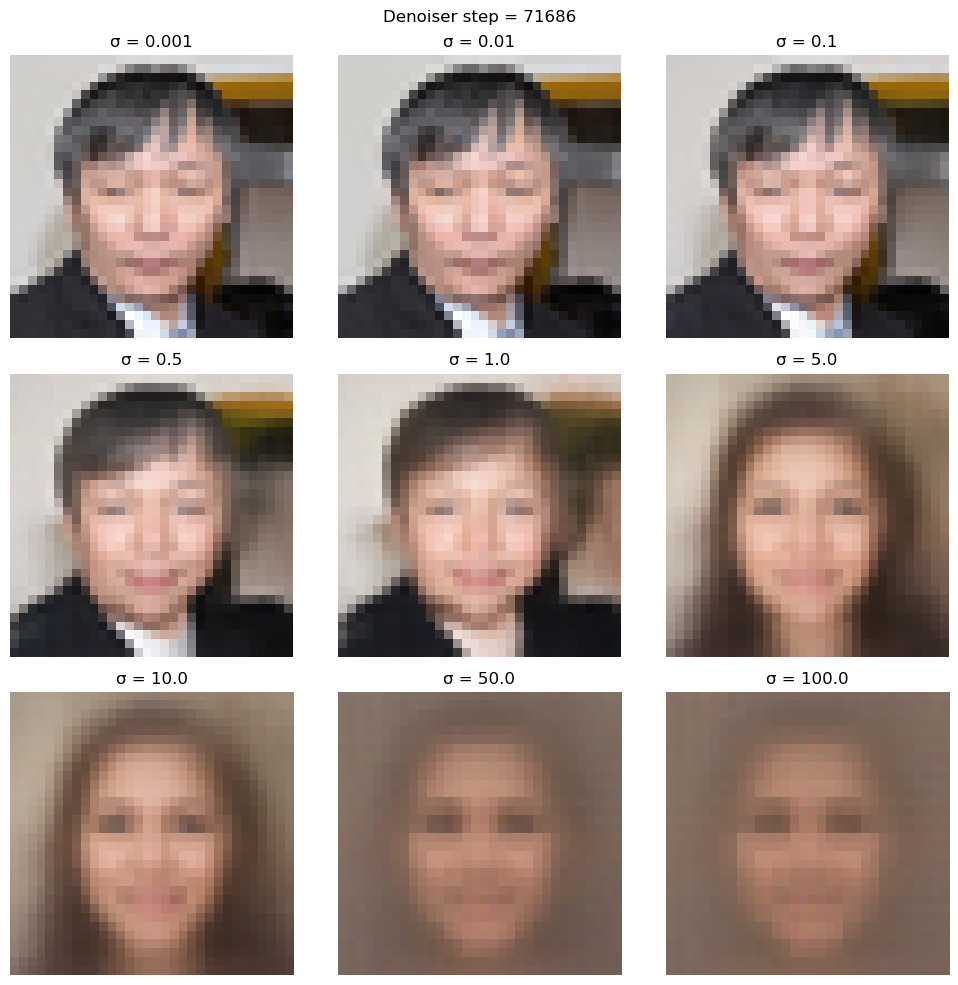

  0%|          | 0/9 [00:00<?, ?it/s]

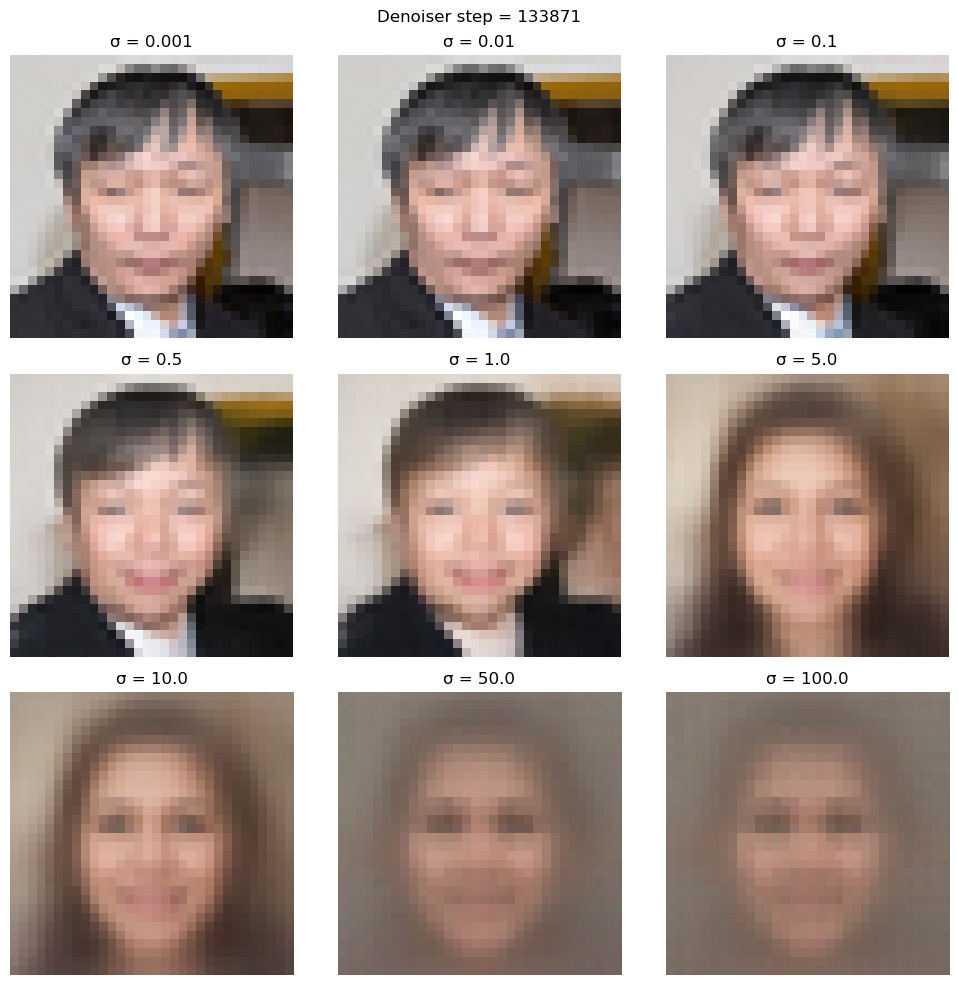

  0%|          | 0/9 [00:00<?, ?it/s]

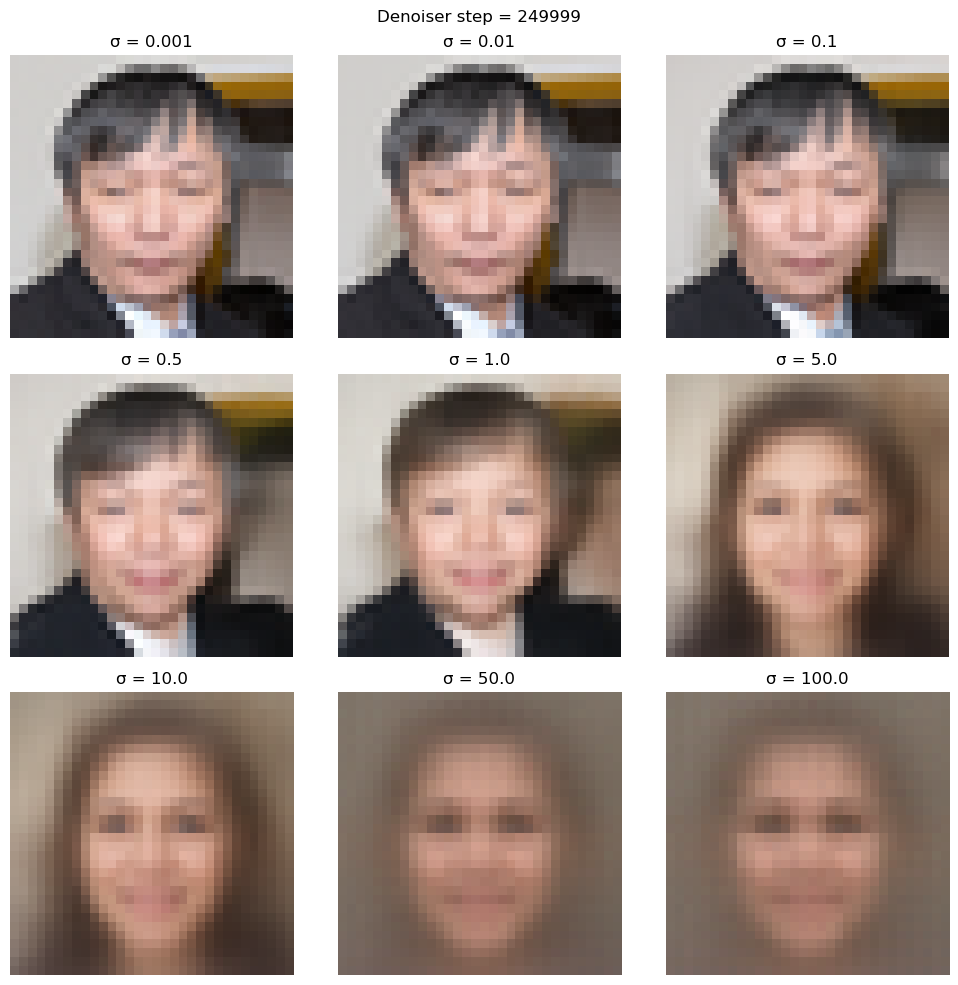

In [21]:
os.makedirs(figdir, exist_ok=True)
ckpt_step_list = find_all_ckpt_steps(ckptdir)
for ckpt_step in ckpt_step_list[::10]:
    ckpt_path = join(ckptdir, f"model_epoch_{ckpt_step:06d}.pth")
    DiT_precd.load_state_dict(torch.load(ckpt_path))
    DiT_precd = DiT_precd.to(device).eval()
    DiT_precd.requires_grad_(False);
    save_dict = {}
    noise_z = torch.randn(imgshape, generator=torch.Generator().manual_seed(0))
    denoises_col = {}
    for sigma in tqdm([0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]):
        x_probe = ref_x + sigma * noise_z
        t_sigma = sigma * torch.ones(1, device=device)
        denoised = DiT_precd(x_probe[None].to(device), t_sigma)
        denoises_col[sigma] = denoised.detach().cpu()
    
    # Create a figure with 3x3 subplots to display the denoised images
    fig, axs = plt.subplots(3, 3, figsize=(10, 10))
    sigmas = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
    # Flatten the axes array for easier iteration
    axs = axs.flatten()
    # Plot each denoised image with its corresponding sigma value
    for i, sigma in enumerate(sigmas):
        # Get the denoised image and convert to numpy for plotting
        denoised_img = denoises_col[sigma][0].permute(1, 2, 0).cpu().numpy()
        # Rescale from [-1, 1] to [0, 1] for proper display
        denoised_img = (denoised_img + 1) / 2
        # Clip values to ensure they're in the valid range
        denoised_img = np.clip(denoised_img, 0, 1)
        # Display the image
        axs[i].imshow(denoised_img)
        axs[i].set_title(f"σ = {sigma}")
        axs[i].axis('off')

    plt.suptitle(f"Denoiser step = {ckpt_step}")
    plt.tight_layout()
    plt.show()

### Massive produce

In [171]:
def compute_denoised_images(DiT_precd, ckptdir, step_list, ref_x, noise_z=None, device="cuda", noise_seed=0, 
                            noise_levels=[0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]):
    """
    Collect denoised images across different checkpoints and noise levels.
    
    Args:
        data_Xtsr: Tensor containing the dataset images
        imgshape: Shape of the images
        figdir: Directory to save figures
        ckptdir: Directory containing model checkpoints
        DiT_precd: DiT model for prediction
        device: Device to run the model on
        ref_img_idx: Index of the reference image to use
        noise_seed: Seed for random noise generation
        step_interval: Interval for selecting checkpoints
        
    Returns:
        denoises_col: Dictionary of denoised images indexed by (ckpt_step, sigma)
    """
    if noise_z is None:
        noise_z = torch.randn(ref_x.shape, generator=torch.Generator().manual_seed(noise_seed))
    denoises_col = {}
    for ckpt_step in tqdm(step_list):
        ckpt_path = join(ckptdir, f"model_epoch_{ckpt_step:06d}.pth")
        DiT_precd.load_state_dict(torch.load(ckpt_path))
        DiT_precd = DiT_precd.to(device).eval()
        DiT_precd.requires_grad_(False);
        if isinstance(DiT_precd, EDMPrecondWrapper):
            DiT_precd_img = lambda x, sigma: DiT_precd(x.view(x.shape[0], -1), sigma).view(-1,*imgshape) # to have the same signature as the other denoisers
        else:
            DiT_precd_img = DiT_precd
        for sigma in (noise_levels):
            x_probe = ref_x + sigma * noise_z
            t_sigma = sigma * torch.ones(1, device=device)
            denoised = DiT_precd_img(x_probe[None].to(device), t_sigma)
            denoises_col[ckpt_step, sigma] = denoised.cpu()
    
    return denoises_col


In [172]:
from circuit_toolkit.plot_utils import saveallforms, to_imgrid, show_imgrid, save_imgrid

def visualize_denoising_trajectory(denoises_col, denoiserdir, ref_img_idx, noise_seed, show_each_row=False):
    """
    Visualize the denoising trajectory across different noise levels and checkpoints.
    
    Args:
        denoises_col: Dictionary of denoised images indexed by (ckpt_step, sigma)
        denoiserdir: Directory to save the final visualization
        ref_img_idx: Reference image index
        noise_seed: Seed used for noise generation
        figdir: Optional directory to save individual noise level visualizations
    
    Returns:
        imgtsr_all: Tensor containing all visualized images
        imggrid_all: Grid image of all visualizations
    """
    imgtsr_all = []
    noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0][::-1]
    for noise_level in noise_levels:
        img_col = []
        step_list = [step for step, sigma in denoises_col if sigma == noise_level]
        for ckpt_step in step_list:
            denoised = denoises_col[ckpt_step, noise_level]
            denoised = denoised[0]
            img_col.append(denoised)
        imgtsr = torch.stack(img_col, dim=0)
        imgtsr = (imgtsr + 1) / 2
        imgtsr.clamp_(0, 1)
        imggrid = to_imgrid(imgtsr, nrow=len(img_col))
        if show_each_row:
            display(imggrid)
        imgtsr_all.append(imgtsr)
        # if figdir is not None:
        #     saveallforms(imggrid, join(figdir, f"denoised_img_noise_{noise_level:03d}.png"))

    imgtsr_all = torch.cat(imgtsr_all, dim=0)
    imggrid_all = to_imgrid(imgtsr_all, nrow=len(step_list))
    display(imggrid_all)
    imggrid_all.save(join(denoiserdir, f"denoised_img_trajectory_all_noise_levels_refimg{ref_img_idx:05d}_noise_seed{noise_seed:05d}.png"))
    return imgtsr_all, imggrid_all


In [53]:
ref_img_idx = 188
noise_seed = 10
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
denoises_col = compute_denoised_images(DiT_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
# Call the function with the current parameters
imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col, denoiserdir, ref_img_idx, noise_seed, )

Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/18 [00:00<?, ?it/s]

Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/18 [00:00<?, ?it/s]

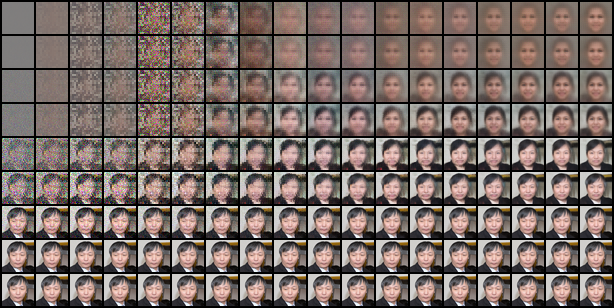

In [54]:
ref_img_idx = 188
noise_seed = 10
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
denoises_col = compute_denoised_images(DiT_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col, denoiserdir, ref_img_idx, noise_seed, )

Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/18 [00:00<?, ?it/s]

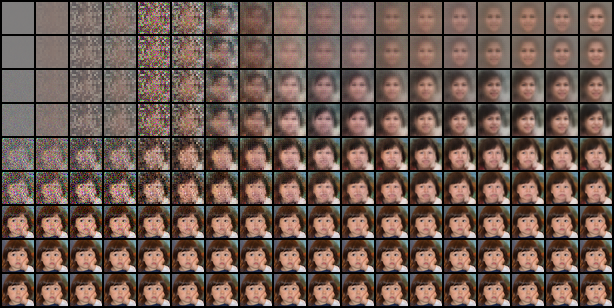

In [55]:
ref_img_idx = 177
noise_seed = 10
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
denoises_col = compute_denoised_images(DiT_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col, denoiserdir, ref_img_idx, noise_seed, )

Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/18 [00:00<?, ?it/s]

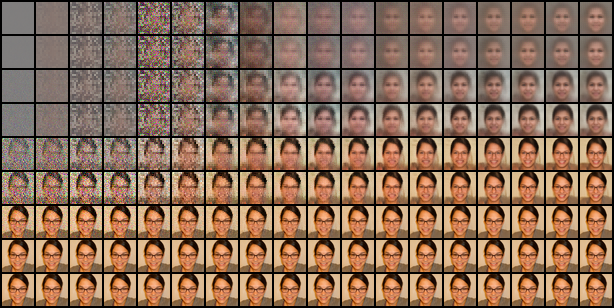

In [56]:
ref_img_idx = 37
noise_seed = 10
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
denoises_col = compute_denoised_images(DiT_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col, denoiserdir, ref_img_idx, noise_seed, )

### project the difference along eigenbasis

In [125]:
data_Xtsr = torch.load("/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/wordnet_render_dataset/ffhq-32x32.pt")
Xtsr = (data_Xtsr - 0.5) / 0.5
pnts = Xtsr.view(Xtsr.shape[0], -1).cuda()
ndim = pnts.shape[1]
X_mean = pnts.mean(dim=0)
data_cov = torch.cov(pnts.T, correction=1)
# diagonalize the covariance matrix
data_cov_eigs, data_cov_evecs = torch.linalg.eigh(data_cov)
data_cov_eigs = data_cov_eigs.flip(0)
data_cov_evecs = data_cov_evecs.flip(1)
del Xtsr, pnts

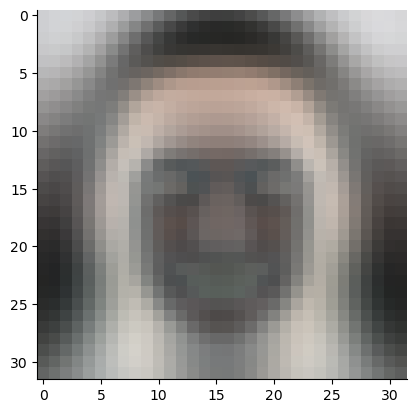

In [ ]:
data_cov_evecs[:,1].view(3,32,32).permute(1,2,0)
plt.imshow(0.5 + 10 *data_cov_evecs[:,10].cpu().view(3,32,32).permute(1,2,0))
plt.show()

In [126]:
ref_img_idx = 189
noise_seed = 55
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::2]
denoises_col = compute_denoised_images(DiT_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
# Call the function with the current parameters
# imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col, denoiserdir, ref_img_idx, noise_seed, )

Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/86 [00:00<?, ?it/s]

In [ ]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
noise_level = 5.0
denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
print(denoiser_trajectory.shape)
denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
deviation_traj = (denoiser_trajectory - denoiser_terminal)
# denoiser_trajectory = denoiser_trajectory.permute(0, 2, 3, 1)
# denoiser_trajectory = (denoiser_trajectory + 1) / 2
# denoiser_trajectory = denoiser_trajectory.clamp(0, 1)

torch.Size([86, 3, 32, 32])

### Print deviation on the Eigenspace

In [93]:
denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
deviation_traj = (denoiser_trajectory - denoiser_terminal).view(denoiser_trajectory.shape[0], -1)
deviation_per_eigvec = (deviation_traj.to("cuda") @ data_cov_evecs)

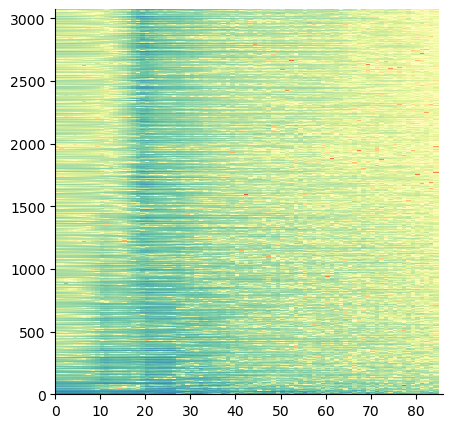

In [94]:
plt.figure(figsize=[5,5])
plt.pcolor(deviation_per_eigvec.abs().log10().cpu().T[::], cmap="Spectral")
plt.show()

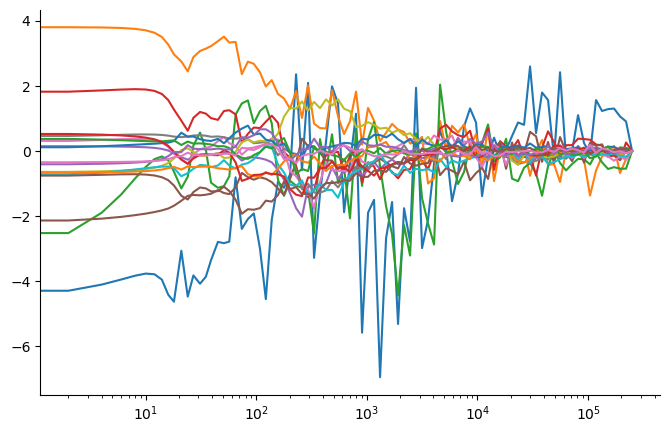

In [99]:
plt.figure(figsize=[8, 5])
plt.plot(step_list, deviation_per_eigvec.cpu()[:, 1:50:3])
# plt.yscale('log')
plt.xscale('log')
plt.show()

In [102]:
deviation_traj.shape

torch.Size([86, 3072])

### Deviation on Fourier space 

In [129]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
noise_level = 5.0
denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
print(denoiser_trajectory.shape)
denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
deviation_traj = (denoiser_trajectory - denoiser_terminal)

torch.Size([86, 3, 32, 32])


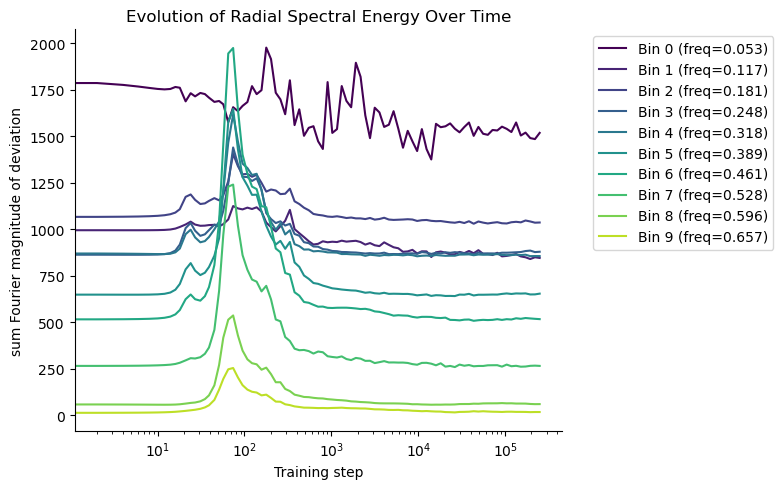

In [165]:
def compute_radial_fourier_spectrum(deviation_traj, num_bins=10, agg_method="sum"):
    """
    Compute the radial Fourier spectrum of a trajectory of deviations.
    
    Args:
        deviation_traj: Tensor of shape (T, C, H, W) or (T, C*H*W)
        num_bins: Number of radial frequency bins
        
    Returns:
        radial_avg: Average magnitude in each radial bin over time (T, num_bins)
        bin_freqs: Average frequency for each bin (num_bins,)
    """
    T = deviation_traj.shape[0]
    # Reshape if needed and compute FFT and magnitude
    if len(deviation_traj.shape) == 2:
        deviation_traj = deviation_traj.reshape(T, 3, 32, 32)
    imgshape = deviation_traj.shape[1:]
    fft_diff = np.fft.fft2(deviation_traj.cpu().numpy(), axes=(2, 3))  # complex array (T,3,32,32)
    mag = np.abs(fft_diff).mean(axis=1)                 # average over channels: (T,32,32)
    
    # Build radial frequency bins
    H, W = imgshape[-2], imgshape[-1]
    fx = np.fft.fftfreq(W)
    fy = np.fft.fftfreq(H)
    u, v = np.meshgrid(fx, fy)
    radial = np.sqrt(u**2 + v**2)
    
    # Create frequency bins
    bin_edges = np.linspace(0, radial.max(), num_bins + 1)
    bin_idx = np.digitize(radial.flatten(), bin_edges)
    
    # Calculate the average frequency for each bin
    bin_freqs = np.zeros(num_bins)
    for b in range(1, num_bins + 1):
        mask = bin_idx == b
        if np.any(mask):
            bin_freqs[b-1] = radial.flatten()[mask].mean()

    # Compute average magnitude in each radial bin over time
    radial_avg = np.zeros((T, num_bins))
    for t in range(T):
        flat_mag = mag[t].flatten()
        for b in range(1, num_bins + 1):
            mask = bin_idx == b
            if agg_method == "sum":
                radial_avg[t, b-1] = flat_mag[mask].sum()
            elif agg_method == "mean":
                radial_avg[t, b-1] = flat_mag[mask].mean()
            else:
                raise ValueError(f"Invalid aggregation method: {agg_method}")
    return radial_avg, bin_freqs


def plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=None, step_list=None, legend=True, agg_method="sum"):
    # Plot the evolution of spectral energy in each radial bin
    Nbins = radial_avg.shape[1]
    assert len(bin_freqs) == Nbins
    if ax is None:
        plt.figure(figsize=(8, 5))
        ax = plt.gca()
    else:
        plt.sca(ax)
    for b in range(Nbins):
        freq_val = bin_freqs[b]
        if step_list is not None:
            plt.plot(step_list, radial_avg[:, b], 
                label=f'Bin {b} (freq={freq_val:.3f})', color=plt.cm.viridis(b/Nbins))
            plt.xscale('log')
        else:
            plt.plot(radial_avg[:, b], 
                label=f'Bin {b} (freq={freq_val:.3f})', color=plt.cm.viridis(b/Nbins))
    plt.xlabel('Training step')
    plt.ylabel(f'{agg_method} Fourier magnitude of deviation')
    plt.title('Evolution of Radial Spectral Energy Over Time')
    if legend:
        plt.legend(ncol=1, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    return ax

# Compute the radial Fourier spectrum
Nbins = 10
radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
plot_radial_fourier_spectrum(radial_avg, bin_freqs, step_list=step_list);

### DiT ｜ Test various functions

In [224]:
# loading config 
expname = "FFHQ32_DiT_P2_384D_6H_6L_EDM_saveckpt_fewsample_longtrain"
savedir = join(saveroot, expname)
ckptdir = join(savedir, "ckpts")
sample_dir = join(savedir, "samples")
config = edict(json.load(open(f"{savedir}/config.json")))
args = edict(json.load(open(f"{savedir}/args.json")))
pprint(config)
DiT_model = DiT(**config)
DiT_precd = EDMDiTPrecondWrapper(DiT_model, sigma_data=0.5, sigma_min=0.002, sigma_max=80, rho=7.0)

figdir = join(savedir, "gradient_maps")
jacobdir = join(savedir, "jacobian_store")
denoiserdir = join(savedir, "denoised_imgs")
os.makedirs(figdir, exist_ok=True)
os.makedirs(jacobdir, exist_ok=True)
os.makedirs(denoiserdir, exist_ok=True)

{'class_dropout_prob': 0.1,
 'depth': 6,
 'hidden_size': 384,
 'in_channels': 3,
 'input_size': 32,
 'learn_sigma': False,
 'mlp_ratio': 4,
 'num_classes': 0,
 'num_heads': 6,
 'patch_size': 2}


Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/18 [00:00<?, ?it/s]

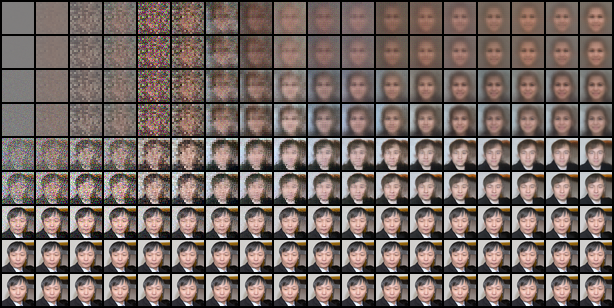

  0%|          | 0/171 [00:00<?, ?it/s]

In [226]:
ref_img_idx = 188
noise_seed = 15
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
denoises_col_fewer = compute_denoised_images(DiT_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
# Call the function with the current parameters
imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col_fewer, denoiserdir, ref_img_idx, noise_seed, )
step2plot = ckpt_step_list[::]
denoises_col = compute_denoised_images(DiT_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)

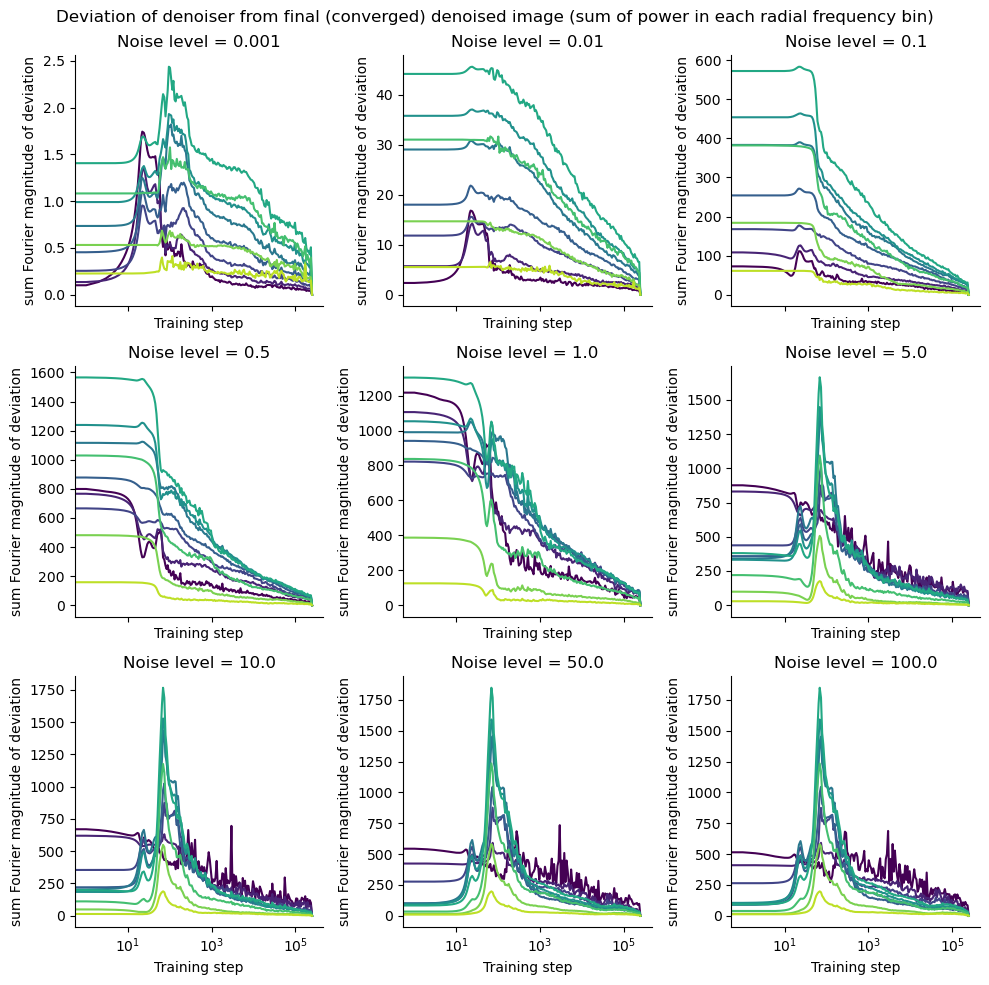

In [ ]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - denoiser_trajectory[-1:])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")
plt.suptitle("Deviation of denoiser from final (converged) denoised image (sum of power in each radial frequency bin)")
plt.tight_layout()
saveallforms(denoiserdir, f"DiT_radial_fourier_power_deviation_from_final_denoised_image_refimg{ref_img_idx}_noise{noise_seed}", figh=fig)
plt.show()

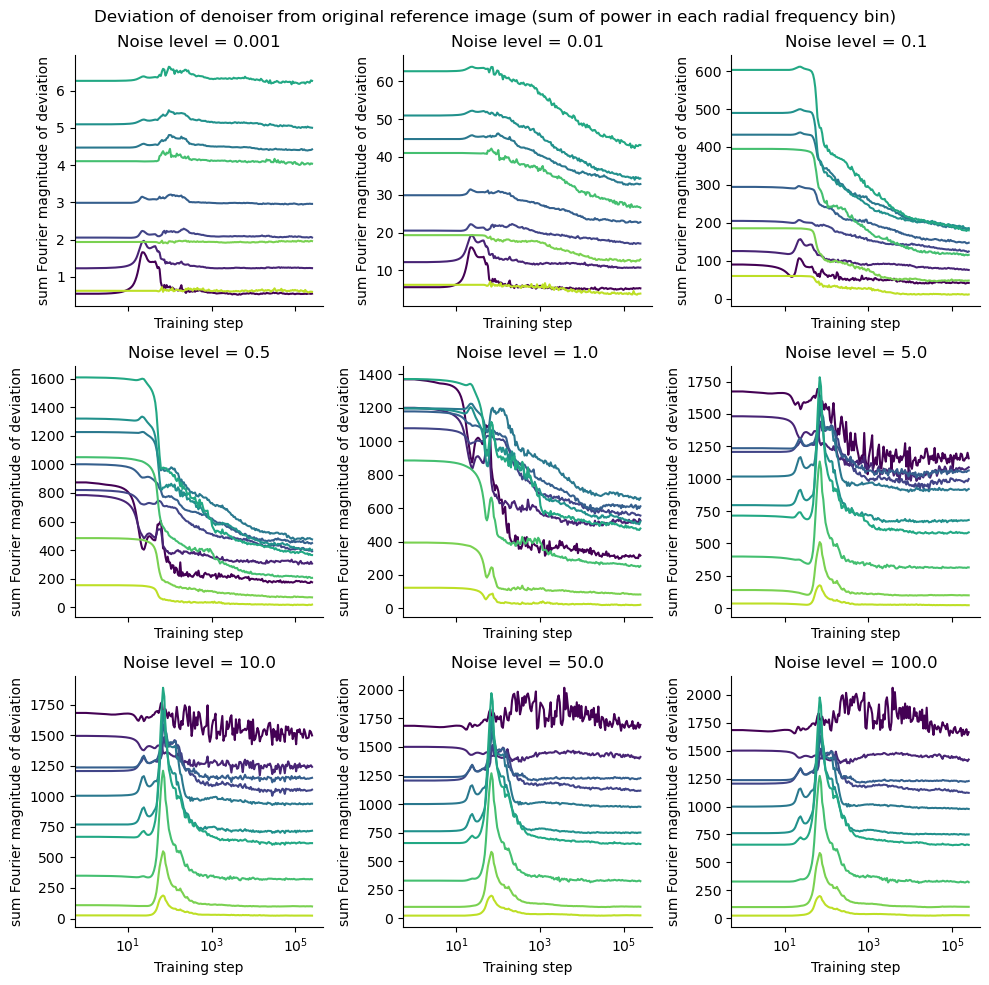

In [229]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - ref_x[None])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")

plt.suptitle("Deviation of denoiser from original reference image (sum of power in each radial frequency bin)")
plt.tight_layout()
saveallforms(denoiserdir, f"DiT_radial_fourier_power_deviation_from_clean_image_refimg{ref_img_idx}_noise{noise_seed}", figh=fig)
plt.show()

## MLP

In [173]:
exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve"
expname = "FFHQ32_UNet_MLP_EDM_8L_3072D_lr1e-4_saveckpt_fewsample_longtrain"
imgshape = (3, 32, 32)
savedir = join(saveroot, expname)
ckptdir = join(savedir, "ckpts")
sample_dir = join(savedir, "samples")
# config = edict(json.load(open(f"{savedir}/config.json")))
args = edict(json.load(open(f"{savedir}/args.json")))
img_ndim = 3072
MLP_model = UNetBlockStyleMLP_backbone(ndim=img_ndim, nlayers=args.mlp_layers, nhidden=args.mlp_hidden_dim, time_embed_dim=args.mlp_time_embed_dim,)
MLP_precd = EDMPrecondWrapper(MLP_model, sigma_data=0.5, sigma_min=0.002, sigma_max=80, rho=7.0)

Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/18 [00:00<?, ?it/s]

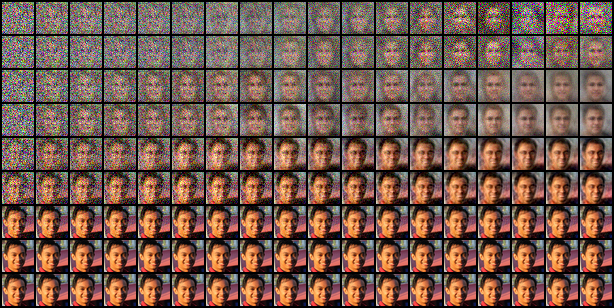

  0%|          | 0/86 [00:00<?, ?it/s]

In [181]:
ref_img_idx = 19
noise_seed = 15
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
denoises_col_fewer = compute_denoised_images(MLP_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
# Call the function with the current parameters
imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col_fewer, denoiserdir, ref_img_idx, noise_seed, )
step2plot = ckpt_step_list[::2]
denoises_col = compute_denoised_images(MLP_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)

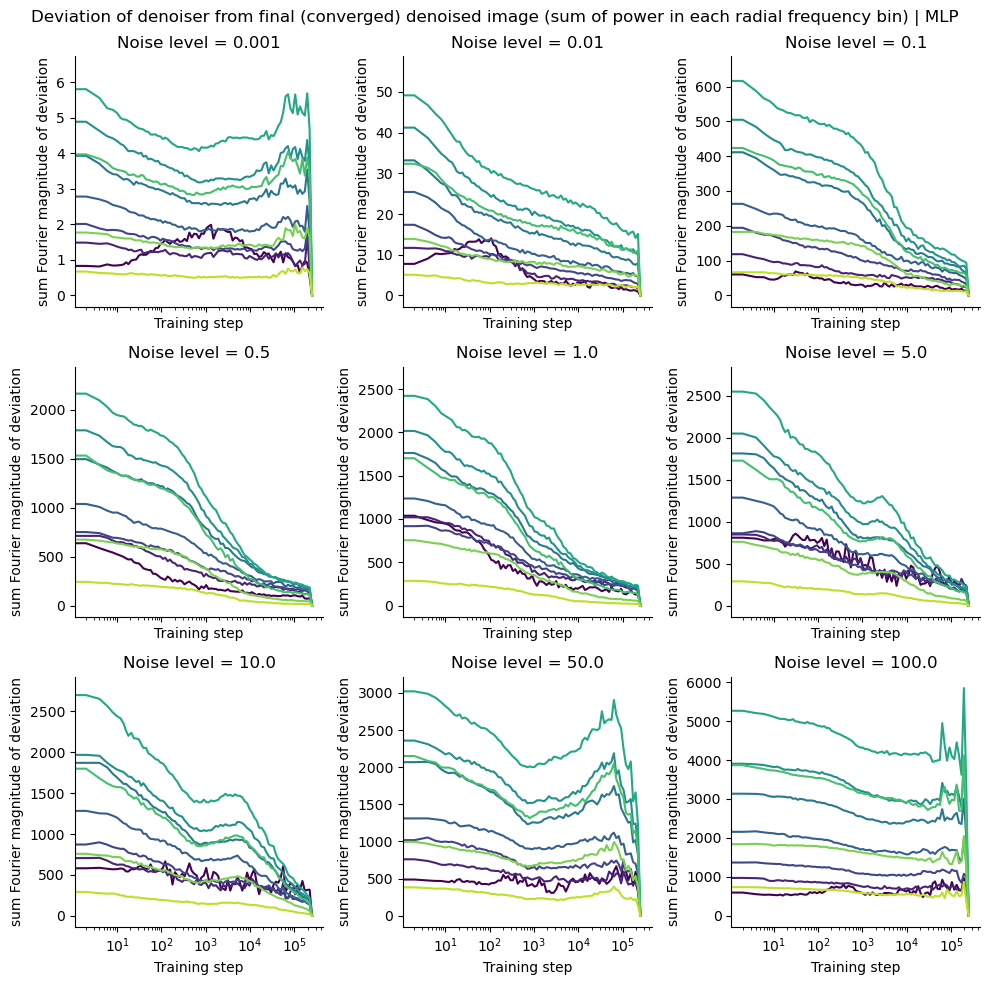

In [182]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - denoiser_trajectory[-1:])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")
plt.suptitle("Deviation of denoiser from final (converged) denoised image (sum of power in each radial frequency bin) | MLP")
plt.tight_layout()
plt.show()

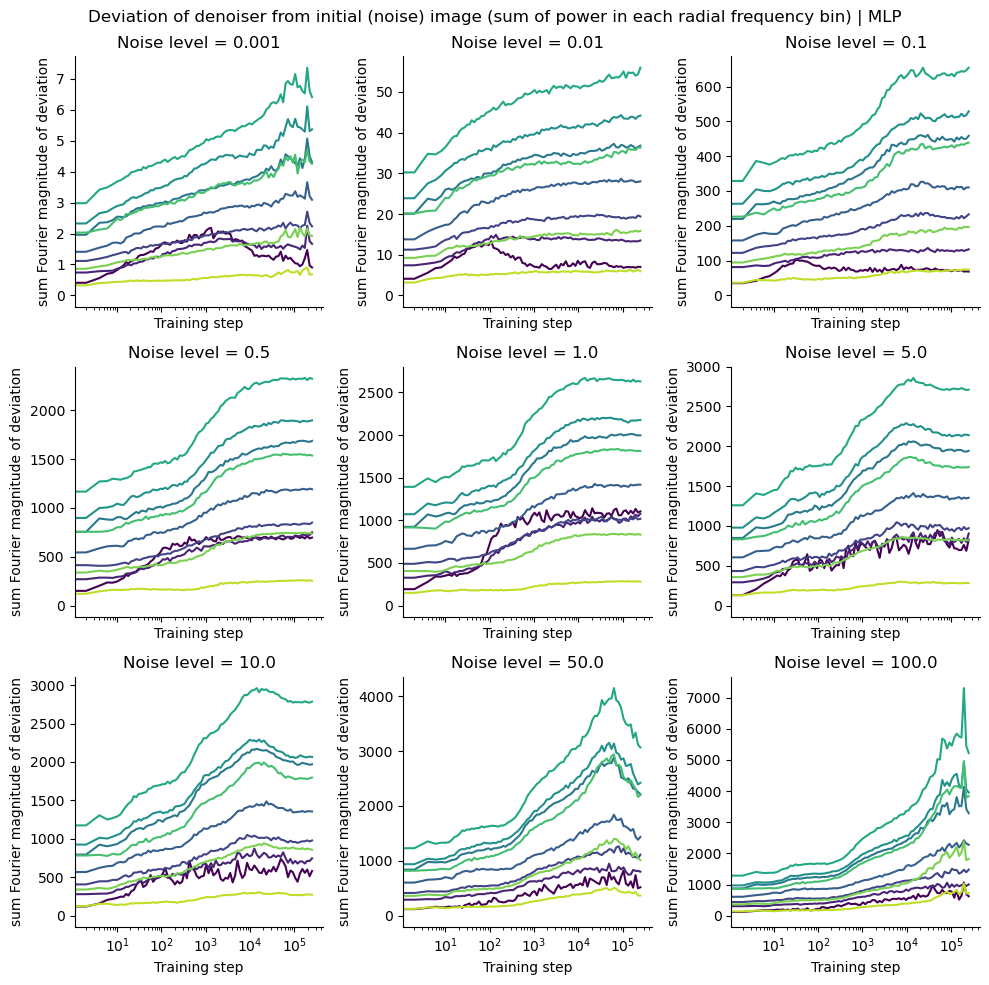

In [184]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - denoiser_trajectory[:1])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")
plt.suptitle("Deviation of denoiser from initial (noise) image (sum of power in each radial frequency bin) | MLP")
plt.tight_layout()
plt.show()

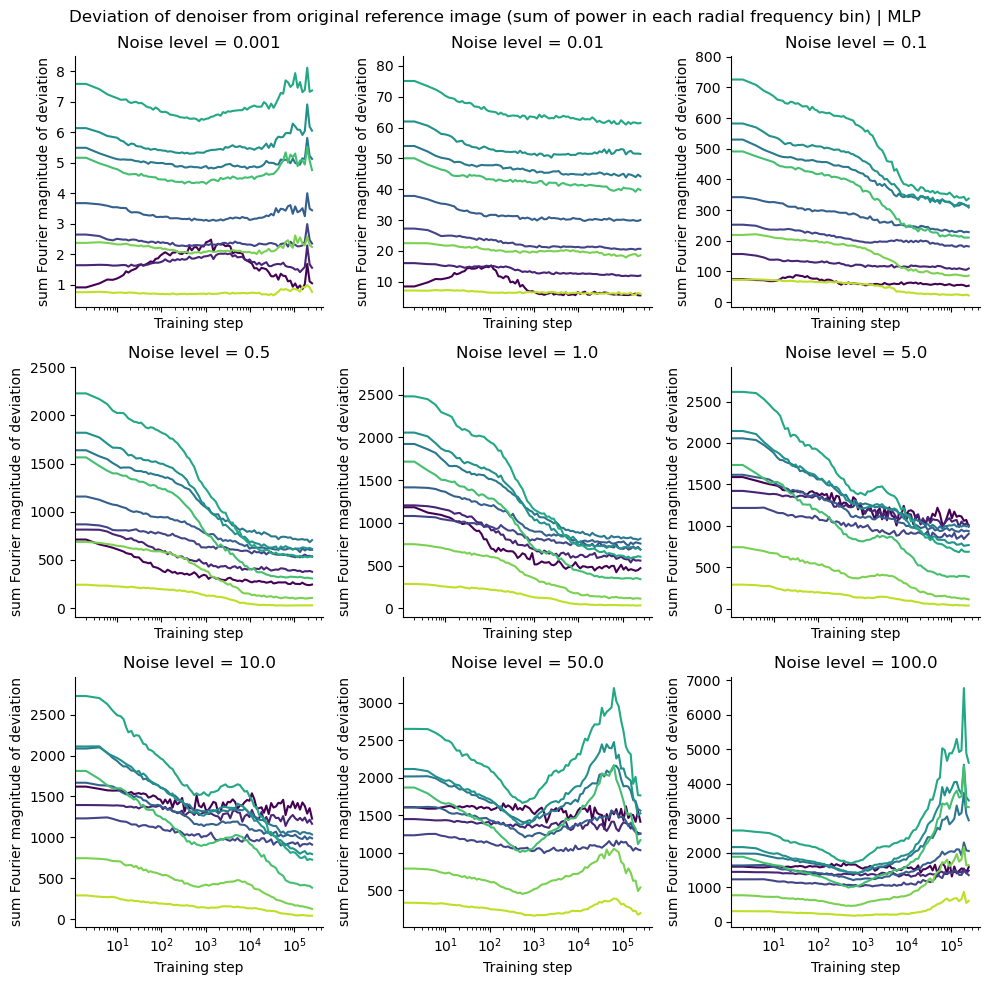

In [183]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - ref_x[None])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")

plt.suptitle("Deviation of denoiser from original reference image (sum of power in each radial frequency bin) | MLP")
plt.tight_layout()
plt.show()

## CNN

In [8]:

#%%
def create_unet_model(config):
    unet = SongUNet(in_channels=config.channels, 
                out_channels=config.channels, 
                num_blocks=config.layers_per_block, 
                attn_resolutions=config.attn_resolutions, 
                decoder_init_attn=config.decoder_init_attn if 'decoder_init_attn' in config else True,
                model_channels=config.model_channels, 
                channel_mult=config.channel_mult, 
                dropout=config.dropout, 
                img_resolution=config.img_size, 
                label_dim=config.label_dim,
                embedding_type='positional', 
                encoder_type='standard', 
                decoder_type='standard', 
                augment_dim=config.augment_dim, #  no augmentation , 9 for defaults. 
                channel_mult_noise=1, 
                resample_filter=[1,1], 
                )
    pytorch_total_grad_params = sum(p.numel() for p in unet.parameters() if p.requires_grad)
    print(f'total number of trainable parameters in the Score Model: {pytorch_total_grad_params}')
    pytorch_total_params = sum(p.numel() for p in unet.parameters())
    print(f'total number of parameters in the Score Model: {pytorch_total_params}')
    return unet

device = "cuda" if torch.cuda.is_available() else "cpu"

In [9]:
exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve"
expname = "FFHQ32_UNet_CNN_EDM_4blocks_wide128_attn_saveckpt_fewsample_longtrain"
savedir = join(saveroot, expname)
ckptdir = join(savedir, "ckpts")
sample_dir = join(savedir, "samples")
config = edict(json.load(open(f"{savedir}/config.json")))
args = edict(json.load(open(f"{savedir}/args.json")))
pprint(config)
unet = create_unet_model(config)
CNN_precd = EDMCNNPrecondWrapper(unet, sigma_data=0.5, sigma_min=0.002, sigma_max=80, rho=7.0)

{'attn_resolutions': [8],
 'augment_dim': 0,
 'channel_mult': [1, 2, 2, 2],
 'channels': 3,
 'decoder_init_attn': True,
 'dropout': 0.0,
 'img_size': 32,
 'label_dim': 0,
 'layers_per_block': 1,
 'model_channels': 128}
total number of trainable parameters in the Score Model: 28183299
total number of parameters in the Score Model: 28183299


Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/18 [00:00<?, ?it/s]

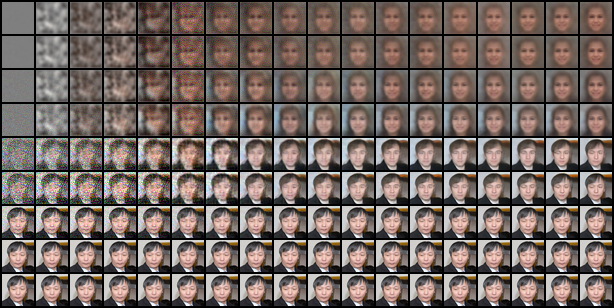

  0%|          | 0/86 [00:00<?, ?it/s]

In [191]:
ref_img_idx = 188
noise_seed = 15
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
ckpt_step_list = find_all_ckpt_steps(ckptdir)
step2plot = ckpt_step_list[::10]
denoises_col_fewer = compute_denoised_images(CNN_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)
# Call the function with the current parameters
imgtsr_all, imggrid_all = visualize_denoising_trajectory(denoises_col_fewer, denoiserdir, ref_img_idx, noise_seed, )
step2plot = ckpt_step_list[::2]
denoises_col = compute_denoised_images(CNN_precd, ckptdir, step2plot, ref_x, noise_z=None, noise_seed=noise_seed)

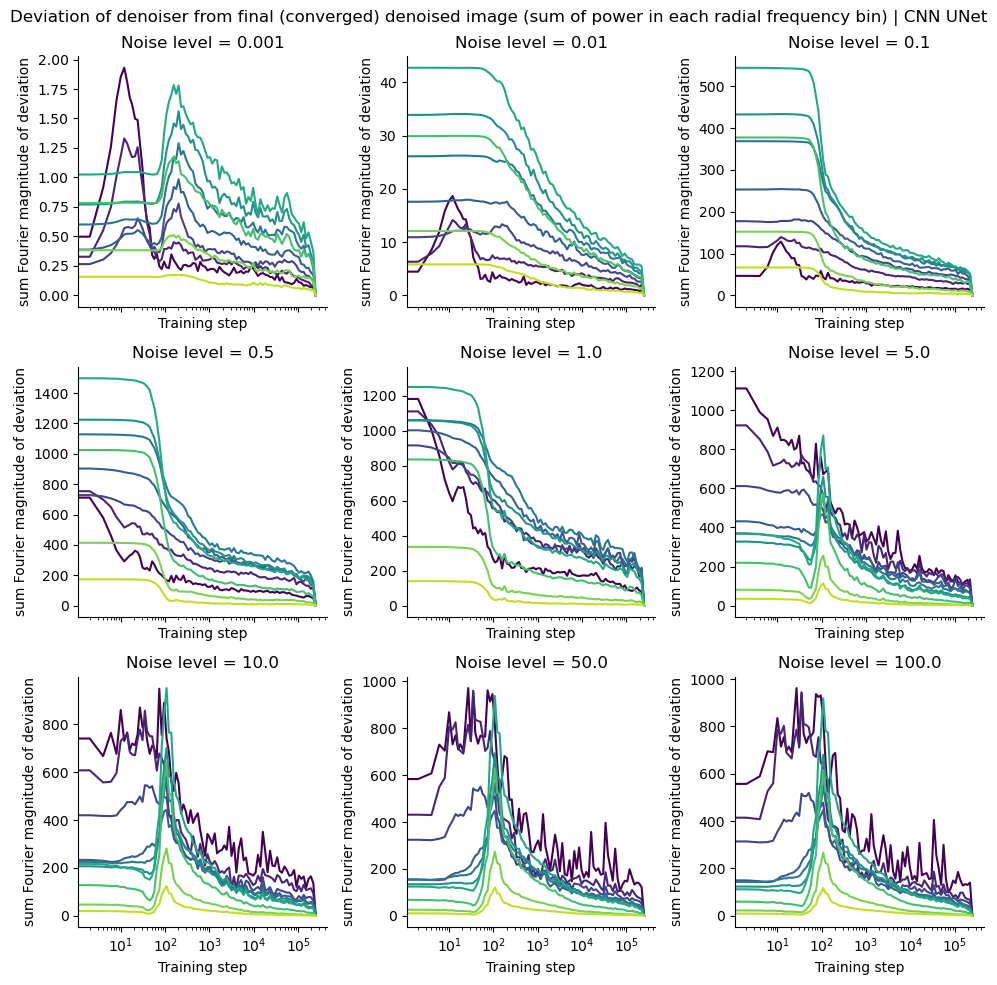

In [188]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - denoiser_trajectory[-1:])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")
plt.suptitle("Deviation of denoiser from final (converged) denoised image (sum of power in each radial frequency bin) | CNN UNet")
plt.tight_layout()
plt.show()

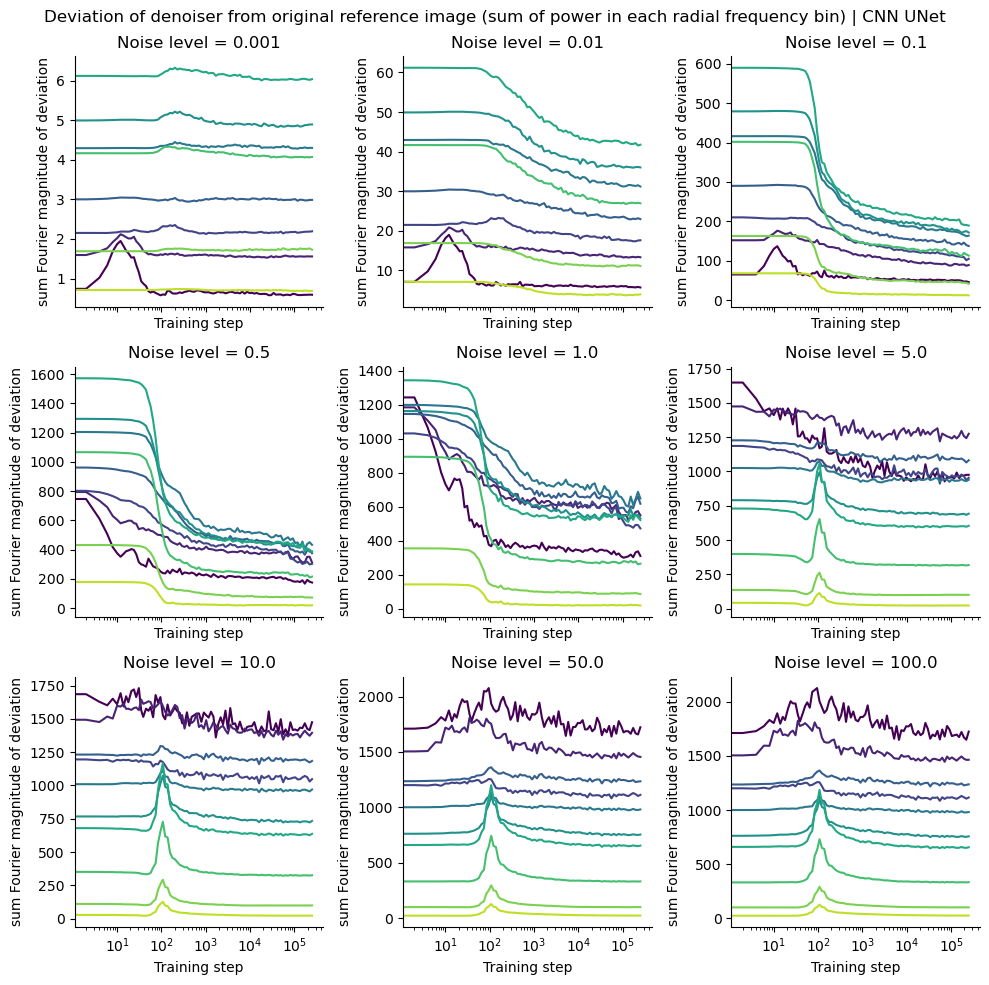

In [190]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - ref_x[None])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")

plt.suptitle("Deviation of denoiser from original reference image (sum of power in each radial frequency bin) | CNN UNet")
plt.tight_layout()
plt.show()

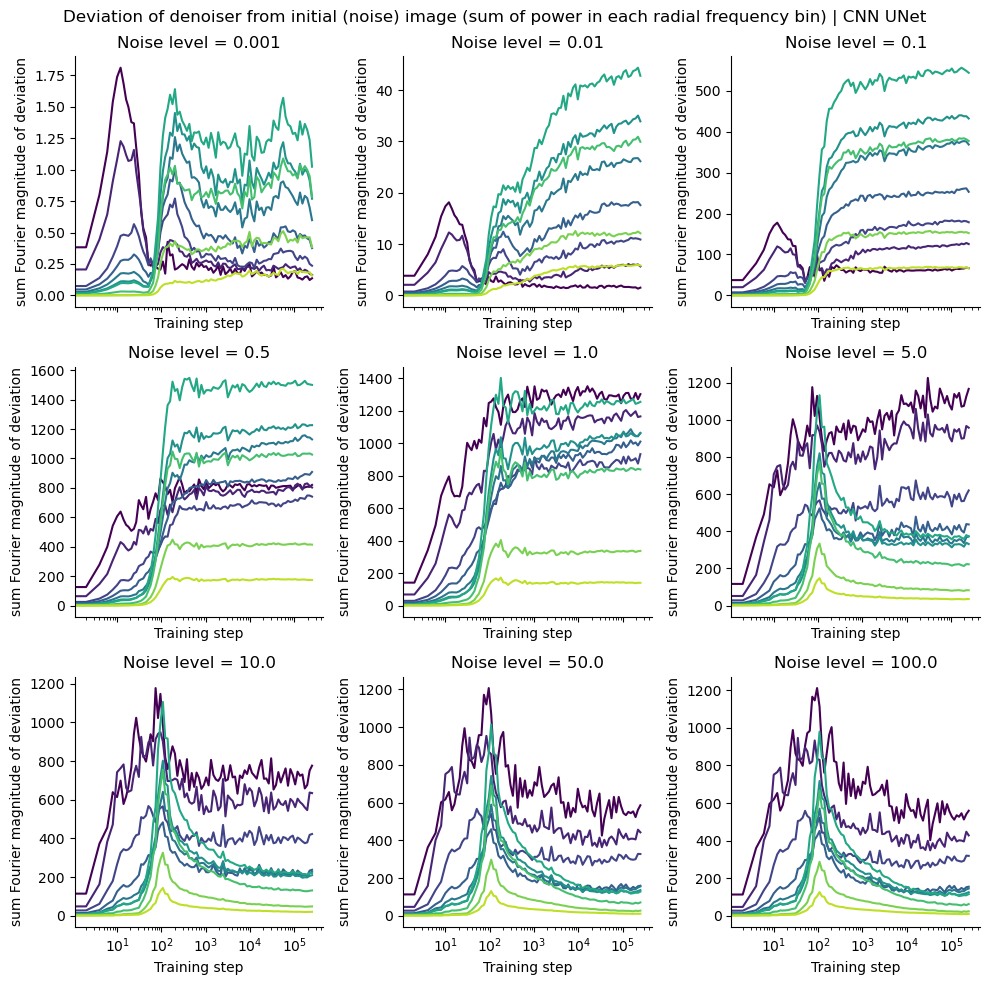

In [189]:
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
step_list = [step for step, sigma in denoises_col if sigma == noise_levels[0]]
fig, axs = plt.subplots(3, 3, figsize=(10, 10), sharex="all", )
axs = axs.flatten()
for ni, noise_level in enumerate(noise_levels):
    ax = axs[ni]
    denoiser_trajectory = torch.cat([denoises_col[step, noise_level] for step in step_list], dim=0)
    # denoiser_terminal = denoiser_trajectory[-1:] # (1,3,32,32)
    deviation_traj = (denoiser_trajectory - denoiser_trajectory[:1])
    radial_avg, bin_freqs = compute_radial_fourier_spectrum(deviation_traj, num_bins=Nbins, agg_method="sum")
    plot_radial_fourier_spectrum(radial_avg, bin_freqs, ax=ax, legend=False, step_list=step_list)
    ax.set_title(f"Noise level = {noise_level}")
plt.suptitle("Deviation of denoiser from initial (noise) image (sum of power in each radial frequency bin) | CNN UNet")
plt.tight_layout()
plt.show()

### Quantify using High frequency ratio

In [192]:
import torch.fft

def hf_energy_ratio(x, low_cutoff=0.1):
    """
    x: Tensor image of shape (C,H,W), assumed normalized
    low_cutoff: fraction of the lowest frequencies to *exclude* from HF band
    """
    C, H, W = x.shape
    # 1) compute 2D FFT per channel
    F = torch.fft.fftshift(torch.fft.fft2(x, norm='ortho'), dim=(-2,-1))
    # 2) build a radial mask
    ys = torch.linspace(-0.5, 0.5, H, device=x.device)
    xs = torch.linspace(-0.5, 0.5, W, device=x.device)
    Y, X = torch.meshgrid(ys, xs, indexing='ij')
    R = (X**2 + Y**2).sqrt()
    mask = (R >= low_cutoff)     # high‑freq if radius ≥ cutoff
    # 3) compute energy
    ps = (F.abs()**2).mean(dim=0)   # average over channels
    return ps[mask].sum() / ps.sum()

In [193]:
import pandas as pd

In [220]:
hf_ratio_col = {}
for step, noise_level in denoises_col.keys():
    denoiser_img = denoises_col[step, noise_level][0].clamp(-1,1)*0.5 + 0.5
    denoiser_terminal = denoises_col[249999, noise_level]
    denoiser_terminal_img = denoiser_terminal[0].clamp(-1,1)*0.5 + 0.5
    hf_ratio_col[step, noise_level] = hf_energy_ratio(denoiser_img, low_cutoff=0.3).item()
    # hf_ratio_col[step, noise_level] = hf_energy_ratio(denoiser_img - denoiser_terminal_img, low_cutoff=0.5).item()

In [221]:
# hf_df = pd.DataFrame(hf_ratio_col, )
# Convert to DataFrame
df = pd.DataFrame.from_dict(hf_ratio_col, orient='index', columns=['hf_ratio'])
df.index = pd.MultiIndex.from_tuples(df.index, names=['step', 'noise_level'])
df = df.reset_index()

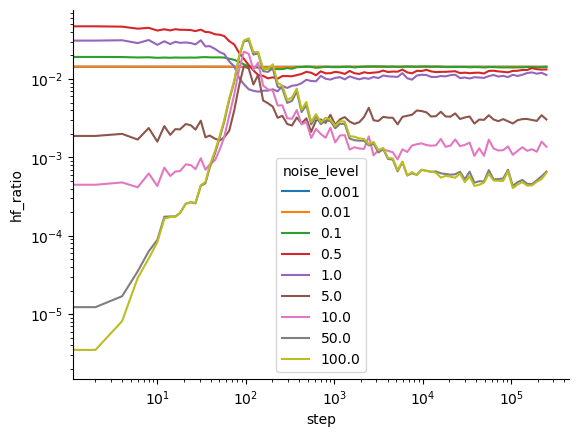

In [222]:
sns.lineplot(data=df, x='step', y='hf_ratio', hue='noise_level', legend=True, palette='tab10')
plt.xscale('log')
plt.yscale('log')
plt.show()

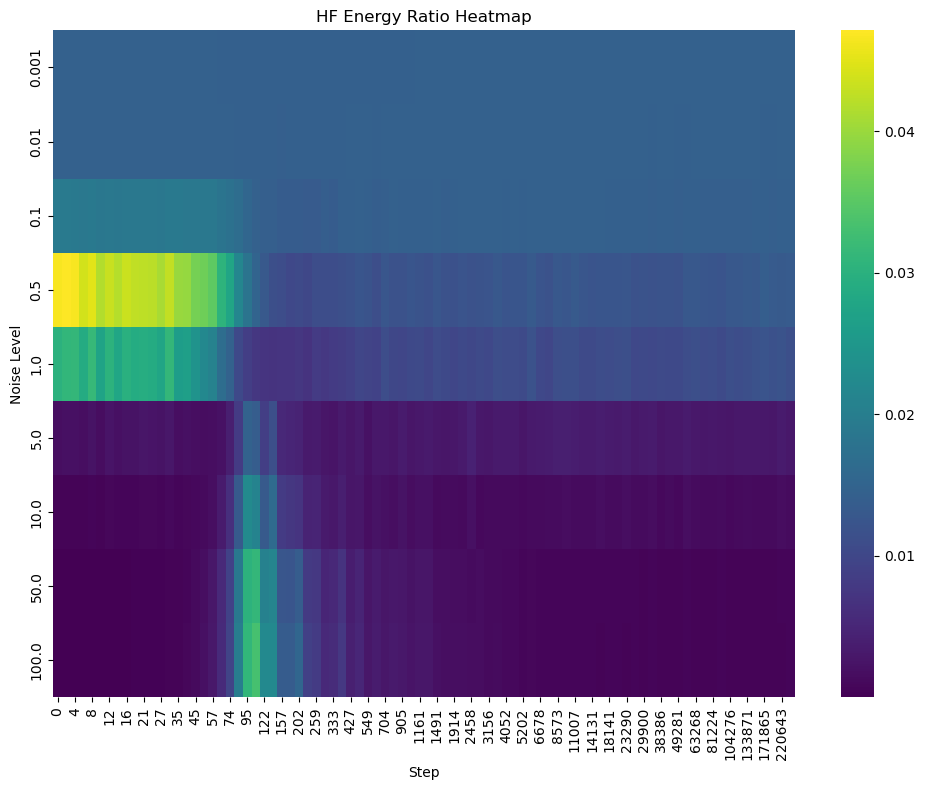

In [223]:
# pivot the dataframe to create a matrix with steps as rows and noise levels as columns
pivot_df = df.pivot(index='step', columns='noise_level', values='hf_ratio')
# plot heatmap of hf_ratio
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_df.T, cmap='viridis', annot=False, fmt='.2f', cbar=True)
plt.title('HF Energy Ratio Heatmap')
plt.ylabel('Noise Level')
plt.xlabel('Step')
plt.tight_layout()
plt.show()

## Scratch function

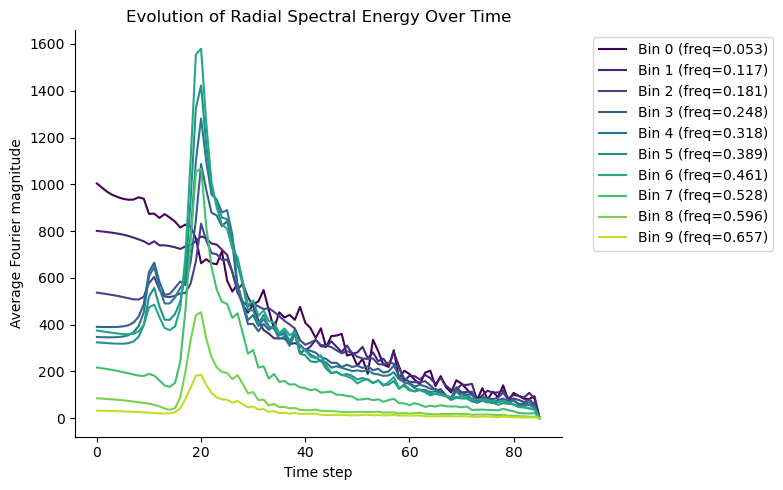

In [130]:
T = deviation_traj.shape[0]
# Compute FFT and magnitude
fft_diff = np.fft.fft2(deviation_traj.reshape(T, 3, 32, 32).cpu().numpy(), axes=(2, 3))  # complex array (T,3,32,32)
mag = np.abs(fft_diff).mean(axis=1)                 # average over channels: (T,32,32)
# Build radial frequency bins
H, W = 32, 32
fx = np.fft.fftfreq(W)
fy = np.fft.fftfreq(H)
u, v = np.meshgrid(fx, fy)
radial = np.sqrt(u**2 + v**2)
Nbins = 10 #H // 2
# Create frequency bins
bin_edges = np.linspace(0, radial.max(), Nbins + 1)
bin_idx = np.digitize(radial.flatten(), bin_edges)
# Calculate the average frequency for each bin
bin_freqs = np.zeros(Nbins)
for b in range(1, Nbins + 1):
    mask = bin_idx == b
    if np.any(mask):
        bin_freqs[b-1] = radial.flatten()[mask].mean()

# Compute average magnitude in each radial bin over time
radial_avg = np.zeros((T, Nbins))
for t in range(T):
    flat_mag = mag[t].flatten()
    for b in range(1, Nbins + 1):
        mask = bin_idx == b
        radial_avg[t, b-1] = flat_mag[mask].sum()

# Plot the evolution of spectral energy in each radial bin
plt.figure(figsize=(8, 5))
for b in range(Nbins):
    freq_val = bin_freqs[b]
    plt.plot(radial_avg[:, b], label=f'Bin {b} (freq={freq_val:.3f})', color=plt.cm.viridis(b/Nbins))
plt.xlabel('Time step')
plt.ylabel('Average Fourier magnitude')
plt.title('Evolution of Radial Spectral Energy Over Time')
plt.legend(ncol=1, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [100]:
# Create a Fourier basis for 3x32x32 images
def create_fourier_basis_2d(h, w, c=3):
    """Create a Fourier basis for images of size (c, h, w)"""
    basis = []
    # Create basis for each frequency
    for u in range(h):
        for v in range(w):
            # Cosine basis (real part)
            basis_cos = torch.zeros(c, h, w)
            # Sine basis (imaginary part)
            basis_sin = torch.zeros(c, h, w)
            
            for i in range(h):
                for j in range(w):
                    # Normalized frequency components
                    cos_val = torch.cos(2 * torch.pi * (u * i / h + v * j / w))
                    sin_val = torch.sin(2 * torch.pi * (u * i / h + v * j / w))
                    
                    # Apply to all channels
                    for ch in range(c):
                        basis_cos[ch, i, j] = cos_val
                        basis_sin[ch, i, j] = sin_val
            
            # Normalize
            basis_cos = basis_cos / torch.norm(basis_cos)
            basis_sin = basis_sin / torch.norm(basis_sin)
            
            basis.append(basis_cos)
            # Skip DC component sine (it's all zeros)
            if not (u == 0 and v == 0):
                basis.append(basis_sin)
    
    # Stack all basis vectors
    return torch.stack(basis)

# Create Fourier basis for our 3x32x32 images
fourier_basis = create_fourier_basis_2d(32, 32, 3).to(device)

# Analyze denoiser trajectory in Fourier space
denoiser_terminal = denoiser_trajectory[-1:]
deviation_traj = (denoiser_trajectory - denoiser_terminal).view(denoiser_trajectory.shape[0], -1)

# Project onto Fourier basis
deviation_per_freq = deviation_traj.to(device) @ fourier_basis.view(fourier_basis.shape[0], -1).T

# Visualize frequency components
plt.figure(figsize=[10, 6])
# Plot absolute values of coefficients (log scale for better visibility)
plt.pcolor(deviation_per_freq.abs().log10().cpu().T, cmap="viridis")
plt.colorbar(label="Log10 Magnitude")
plt.xlabel("Training Steps")
plt.ylabel("Frequency Components")
plt.title("Fourier Analysis of Denoiser Evolution")
plt.show()

# Plot the evolution of selected frequency components
plt.figure(figsize=[10, 6])
# Select a subset of frequencies to plot (low, mid, high)
freq_indices = [0, 10, 50, 100, 200, 500, 1000, 2000]
for idx in freq_indices:
    if idx < deviation_per_freq.shape[1]:
        plt.plot(step_list, deviation_per_freq.cpu()[:, idx], label=f"Freq {idx}")
plt.legend()
plt.xlabel("Training Steps")
plt.ylabel("Coefficient Magnitude")
plt.title("Evolution of Selected Frequency Components")
plt.xscale('log')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.show()

# Compute power spectrum (average energy per frequency)
power_spectrum = deviation_per_freq.abs().mean(dim=0)

# Plot power spectrum
plt.figure(figsize=[10, 6])
plt.plot(power_spectrum.cpu())
plt.xlabel("Frequency Component")
plt.ylabel("Average Magnitude")
plt.title("Power Spectrum of Denoiser Evolution")
plt.yscale('log')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.show()


TypeError: cos(): argument 'input' (position 1) must be Tensor, not float

### Dev zone

In [ ]:
ref_img_idx = 188
noise_seed = 0
ref_x_raw = data_Xtsr[ref_img_idx] # 77 is a nice example
ref_x = (ref_x_raw - 0.5) / 0.5
noise_z = torch.randn(imgshape, generator=torch.Generator().manual_seed(noise_seed))
os.makedirs(figdir, exist_ok=True)
ckpt_step_list = find_all_ckpt_steps(ckptdir)
denoises_col = {}
for ckpt_step in ckpt_step_list[::10]:
    ckpt_path = join(ckptdir, f"model_epoch_{ckpt_step:06d}.pth")
    DiT_precd.load_state_dict(torch.load(ckpt_path))
    DiT_precd = DiT_precd.to(device).eval()
    DiT_precd.requires_grad_(False);
    for sigma in tqdm([0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]):
        x_probe = ref_x + sigma * noise_z
        t_sigma = sigma * torch.ones(1, device=device)
        denoised = DiT_precd(x_probe[None].to(device), t_sigma)
        denoises_col[ckpt_step, sigma] = denoised.cpu()



Found 171 checkpoints in the directory, largest step is 249999


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

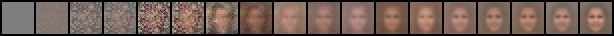

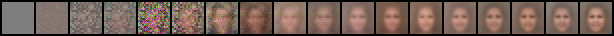

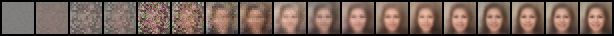

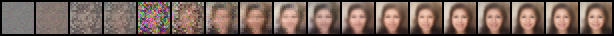

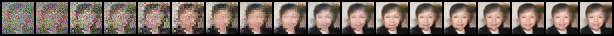

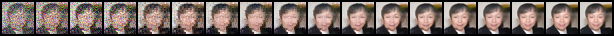

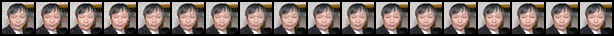

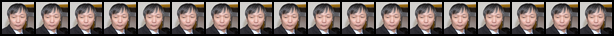

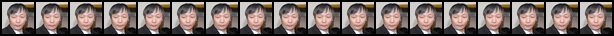

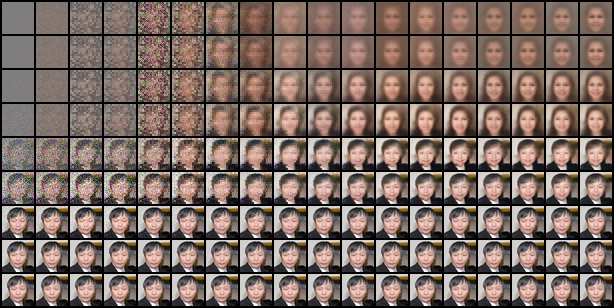

In [46]:
imgtsr_all = []
noise_levels = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0][::-1]
for noise_level in noise_levels:
    img_col = []
    step_list = [step for step, sigma in denoises_col if sigma == noise_level]
    for ckpt_step in step_list:
        denoised = denoises_col[ckpt_step, noise_level]
        denoised = denoised[0]
        img_col.append(denoised)
    imgtsr = torch.stack(img_col, dim=0)
    imgtsr = (imgtsr + 1) / 2
    imgtsr.clamp_(0, 1)
    imggrid = to_imgrid(imgtsr, nrow=len(img_col))
    display(imggrid)
    imgtsr_all.append(imgtsr)
    # saveallforms(imggrid, join(figdir, f"denoised_img_noise_{noise_levels:03d}.png"))

imgtsr_all = torch.cat(imgtsr_all, dim=0)
imggrid_all = to_imgrid(imgtsr_all, nrow=len(step_list))
display(imggrid_all)
imggrid_all.save(join(denoiserdir, f"denoised_img_trajectory_all_noise_levels_refimg{ref_img_idx:05d}_noise_seed{noise_seed:05d}.png"))

In [47]:
denoiserdir

'/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/FFHQ32_DiT_P2_384D_6H_6L_EDM_saveckpt_fewsample_longtrain/denoised_imgs'

### seperated plots

In [ ]:
# Create a figure with 3x3 subplots to display the denoised images
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
sigmas = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
# Flatten the axes array for easier iteration
axs = axs.flatten()
# Plot each denoised image with its corresponding sigma value
for i, sigma in enumerate(sigmas):
    # Get the denoised image and convert to numpy for plotting
    denoised_img = denoises_col[sigma][0].permute(1, 2, 0).cpu().numpy()
    # Rescale from [-1, 1] to [0, 1] for proper display
    denoised_img = (denoised_img + 1) / 2
    # Clip values to ensure they're in the valid range
    denoised_img = np.clip(denoised_img, 0, 1)
    # Display the image
    axs[i].imshow(denoised_img)
    axs[i].set_title(f"σ = {sigma}")
    axs[i].axis('off')

plt.suptitle(f"Denoiser step = {ckpt_step}")
plt.tight_layout()
plt.show()

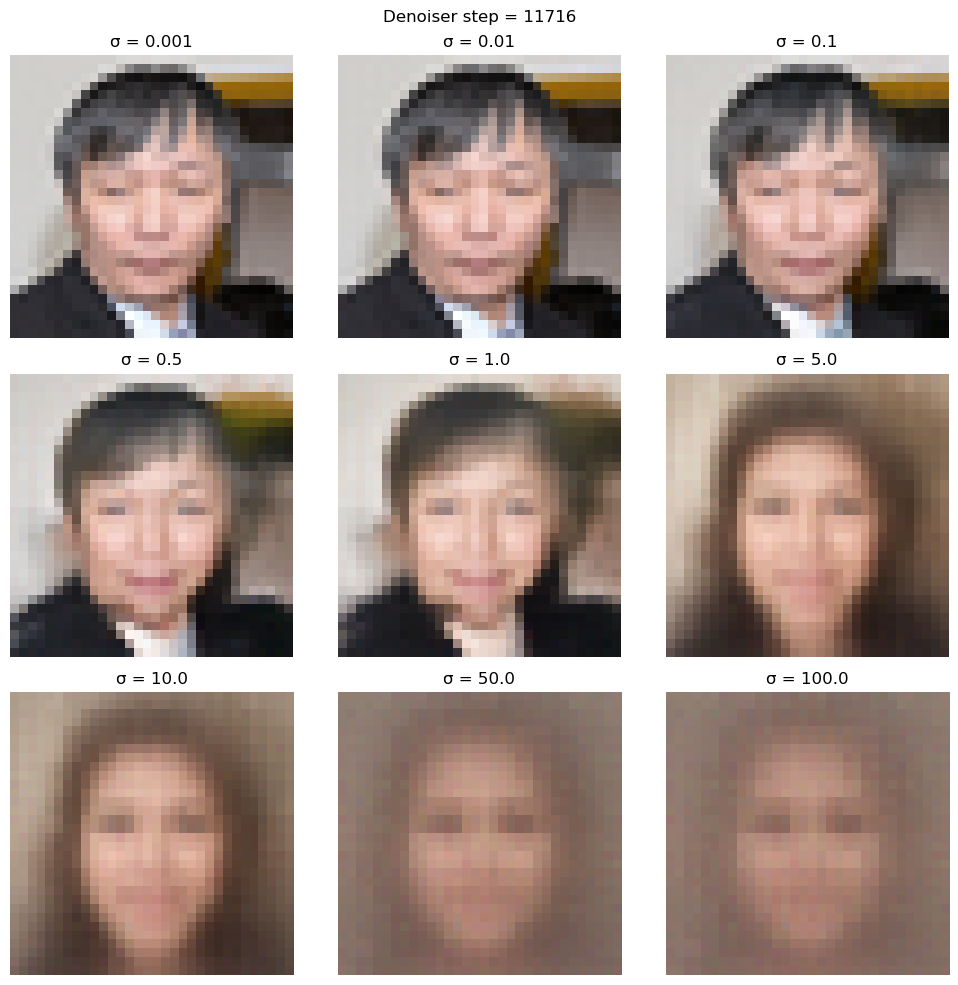

In [20]:
# Create a figure with 3x3 subplots to display the denoised images
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
sigmas = [0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]
# Flatten the axes array for easier iteration
axs = axs.flatten()
# Plot each denoised image with its corresponding sigma value
for i, sigma in enumerate(sigmas):
    # Get the denoised image and convert to numpy for plotting
    denoised_img = denoises_col[sigma][0].permute(1, 2, 0).cpu().numpy()
    # Rescale from [-1, 1] to [0, 1] for proper display
    denoised_img = (denoised_img + 1) / 2
    # Clip values to ensure they're in the valid range
    denoised_img = np.clip(denoised_img, 0, 1)
    # Display the image
    axs[i].imshow(denoised_img)
    axs[i].set_title(f"σ = {sigma}")
    axs[i].axis('off')

plt.suptitle(f"Denoiser step = {ckpt_step}")
plt.tight_layout()
plt.show()